In [44]:
import os
import sys
import random
import math
import numpy as np
import skimage.io
import matplotlib
import coco
import utils
import model as modellib
import visualize
import cv2
import matplotlib.pyplot as plt
from PIL import Image

import visualize_cv
from InI_vid import sensetivity1
from InI_vid import back_proj
from InI_vid import resolution
from InI_vid import gkern
from InI_vid import AGMR
from InI_vid import ReconstructedVideo
from skimage import measure, io, img_as_ubyte
import matplotlib.pyplot as plt
from skimage.color import label2rgb, rgb2gray
import pandas as pd
from pytictoc import TicToc
import scipy.ndimage
from scipy.signal import find_peaks
from scipy.signal import chirp, find_peaks, peak_widths
from scipy.signal import find_peaks, peak_prominences
from visualize_cv import display_instances_tube
from visualize_cv import display_instances


%matplotlib inline 
# Root directory of the project
ROOT_DIR = os.getcwd()

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

# Directory of images to run detection on
IMAGE_DIR = os.path.join(ROOT_DIR, "images")

## configuration 

In [45]:
class InferenceConfig(coco.CocoConfig):
    # Set batch size to 1 since we'll be running inference on
    # one image at a time. Batch size = GPU_COUNT * IMAGES_PER_GPU
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

config = InferenceConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_SHAPES                [[256 256]
 [128 128]
 [ 64  64]
 [ 32  32]
 [ 16  16]]
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
GPU_COUNT                      1
IMAGES_PER_GPU                 1
IMAGE_MAX_DIM                  1024
IMAGE_MIN_DIM                  800
IMAGE_PADDING                  True
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
MASK_POOL_SIZE                 14
MASK_SHAPE                     [28, 28]
MAX_GT_INSTANCES               100
MEAN_PIXEL                     [123.7 116.8 103.9]
MINI_MASK_SHAPE                (56, 56)
NAME                           coco
NUM_CLASSES                    81
POOL_SIZE                      7
POST_NMS_ROIS_INFERENC

## Creat model and load trained weights

In [46]:
# Create model object in inference mode.
model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR, config=config)

# Load weights trained on MS-COCO
model.load_weights(COCO_MODEL_PATH, by_name=True)

## Class names

In [47]:
# COCO Class names
# Index of the class in the list is its ID. For example, to get ID of
# the teddy bear class, use: class_names.index('teddy bear')
class_names = ['BG', 'person', 'bicycle', 'car', 'motorcycle', 'airplane',
               'bus', 'train', 'truck', 'boat', 'traffic light',
               'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird',
               'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear',
               'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie',
               'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
               'kite', 'baseball bat', 'baseball glove', 'skateboard',
               'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup',
               'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple',
               'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
               'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed',
               'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote',
               'keyboard', 'cell phone', 'microwave', 'oven', 'toaster',
               'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors',
               'teddy bear', 'hair drier', 'toothbrush']
#[ 1 67 63]
print(class_names[1])

person


In [48]:
from sklearn.preprocessing import LabelEncoder
import numpy as np
values = np.array(class_names)
print(values)
# integer encode
label_encoder = LabelEncoder()
integer_encoded = label_encoder.fit_transform(values)
print(integer_encoded[50])

['BG' 'person' 'bicycle' 'car' 'motorcycle' 'airplane' 'bus' 'train'
 'truck' 'boat' 'traffic light' 'fire hydrant' 'stop sign' 'parking meter'
 'bench' 'bird' 'cat' 'dog' 'horse' 'sheep' 'cow' 'elephant' 'bear'
 'zebra' 'giraffe' 'backpack' 'umbrella' 'handbag' 'tie' 'suitcase'
 'frisbee' 'skis' 'snowboard' 'sports ball' 'kite' 'baseball bat'
 'baseball glove' 'skateboard' 'surfboard' 'tennis racket' 'bottle'
 'wine glass' 'cup' 'fork' 'knife' 'spoon' 'bowl' 'banana' 'apple'
 'sandwich' 'orange' 'broccoli' 'carrot' 'hot dog' 'pizza' 'donut' 'cake'
 'chair' 'couch' 'potted plant' 'bed' 'dining table' 'toilet' 'tv'
 'laptop' 'mouse' 'remote' 'keyboard' 'cell phone' 'microwave' 'oven'
 'toaster' 'sink' 'refrigerator' 'book' 'clock' 'vase' 'scissors'
 'teddy bear' 'hair drier' 'toothbrush']
47


### Adaptive class list
This function finds the classes that exist in the original video frame taken from camera 2.4 and create a class list for the integral imaging video

In [49]:
def Frame_class_names(ids, class_names=class_names):
    """"
    The function return list of label and class ids of the corrent frame
    class_names is list of all the labels in the model
    ids- is the ids of all the labels in the class_name
    """
    class_names_list = []
    class_ids = []
    counter = 0
    for i in ids:
        class_names_list.append(class_names[i])
        class_ids.append(counter)
        counter+=1
    class_names_list = list(dict.fromkeys(class_names_list))
    class_ids = list(dict.fromkeys(class_ids))
    return class_names_list,  np.array(class_ids)




  

### This section of code capture frame from the elemntal's video's (camera 3.7) in order to:
* Makes instance segmantation for all the frames 
* Creat a new class ids list thet contain all the labels that the mask R-CNN creat for the corren video

Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000


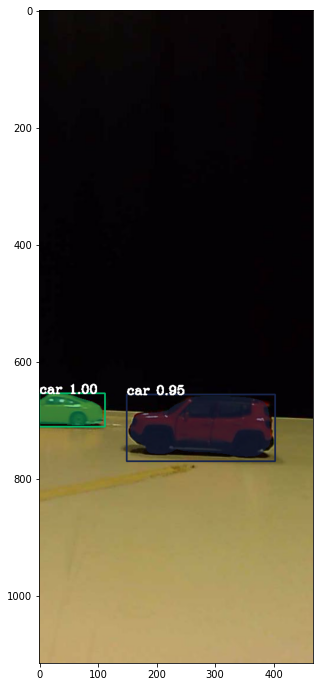

[3 3]
rois is: [[654   0 711 112]
 [656 149 770 402]]
[3 3]
1
2
3
4
5
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000


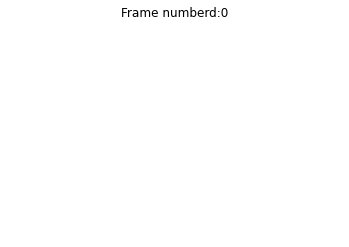

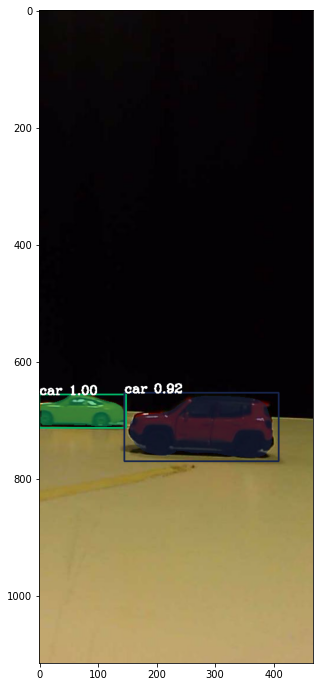

[3 3]
rois is: [[656   0 713 148]
 [653 145 770 408]]
[3 3 3 3]
6
7
8
9
10
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000


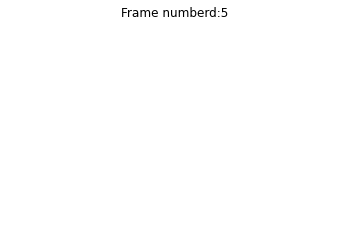

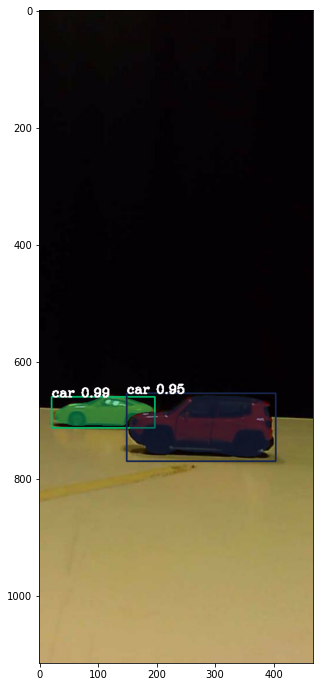

[3 3]
rois is: [[660  21 713 197]
 [654 149 770 403]]
[3 3 3 3 3 3]
11
12
13
14
15
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000


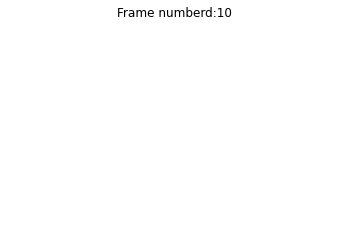

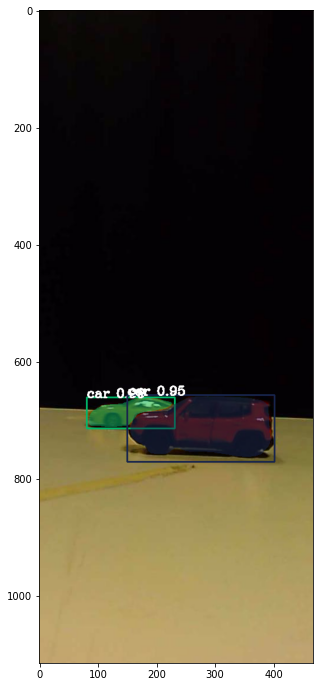

[3 3]
rois is: [[661  81 714 231]
 [657 150 771 401]]
[3 3 3 3 3 3 3 3]
16
17
18
19
20
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000


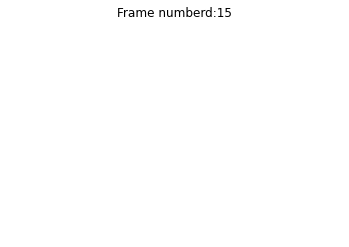

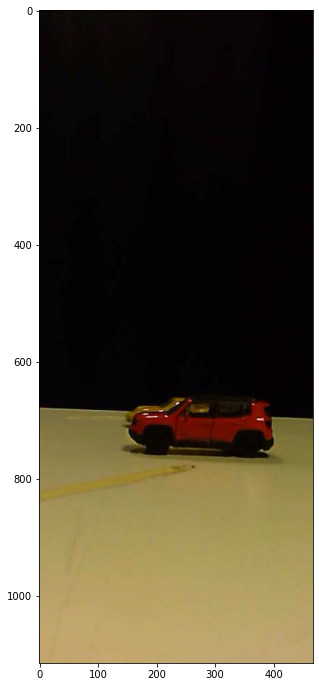

[]
rois is: []
[3 3 3 3 3 3 3 3]
21
22
23
24
25
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000


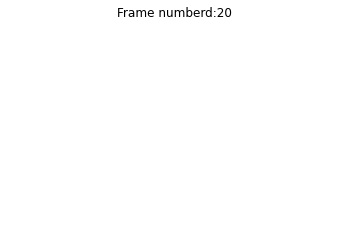

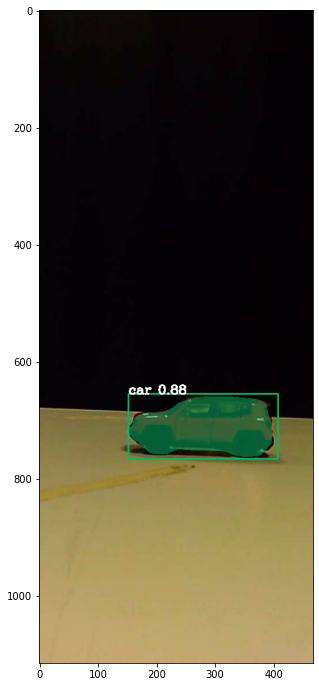

[3]
rois is: [[655 152 766 407]]
[3 3 3 3 3 3 3 3 3]
26
27
28
29
30
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  150.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000


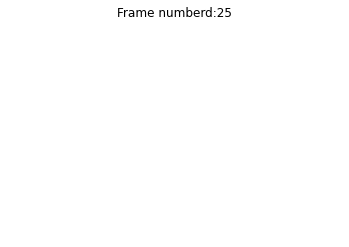

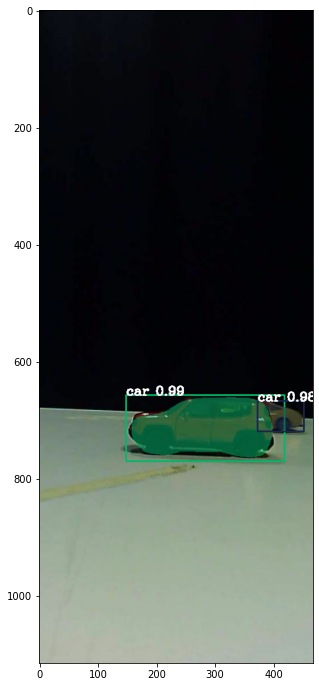

[3 3]
rois is: [[657 148 770 418]
 [667 372 719 451]]
[3 3 3 3 3 3 3 3 3 3 3]
31
32
33
34
35
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000


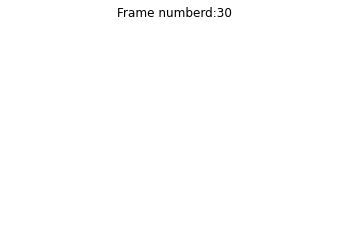

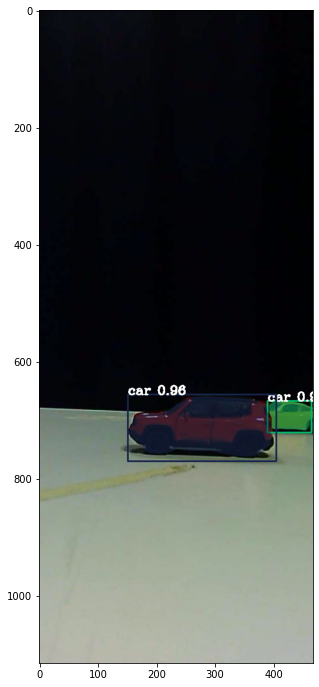

[3 3]
rois is: [[667 389 721 464]
 [656 151 770 404]]
[3 3 3 3 3 3 3 3 3 3 3 3 3]
36
37
38
39
40
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000


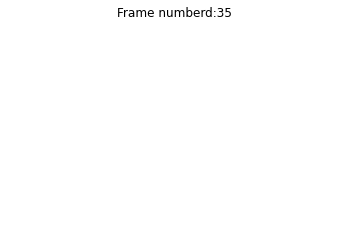

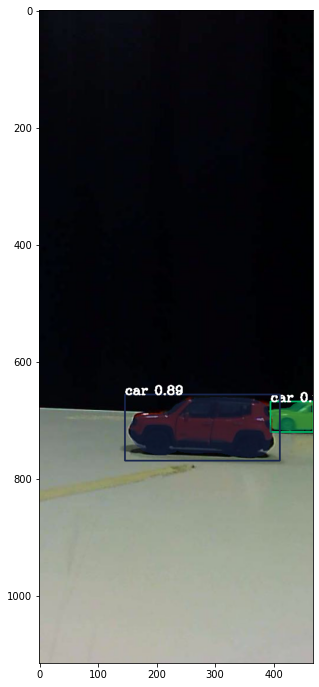

[3 3]
rois is: [[668 394 720 467]
 [656 146 769 410]]
[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]
41
42
43
44
45
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000


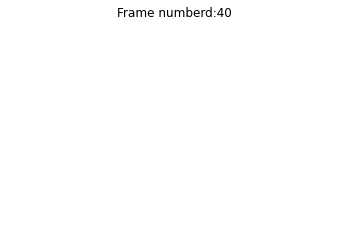

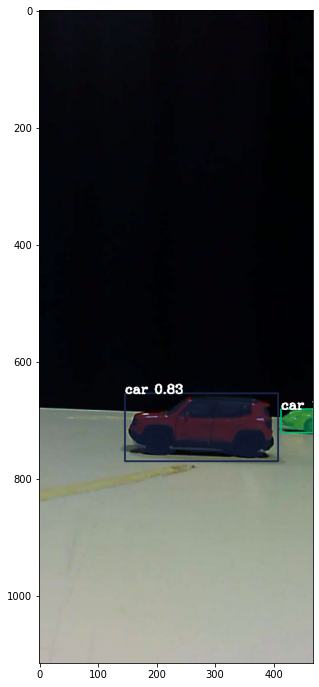

[3 3]
rois is: [[681 412 721 467]
 [654 146 770 407]]
[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]
46
47
48
49
50
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000


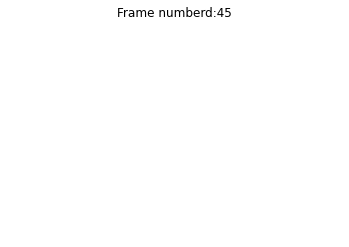

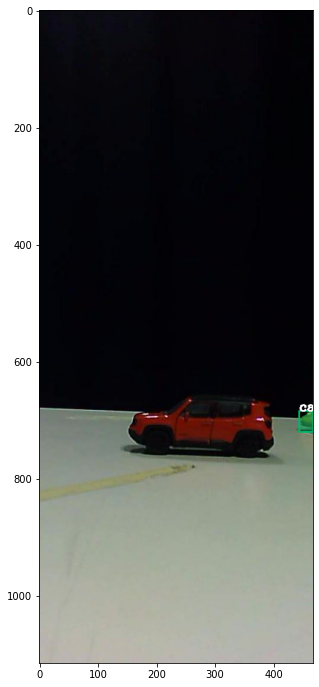

[3]
rois is: [[684 443 720 467]]
[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]
51
52
53
54
55
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000


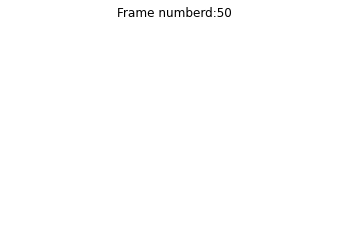

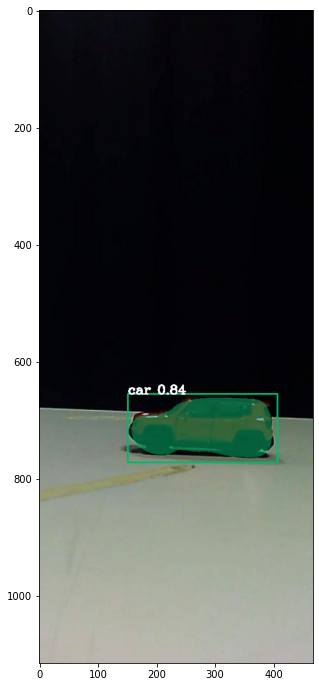

[3]
rois is: [[655 151 772 406]]
[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]
56
57
58
59
60
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000


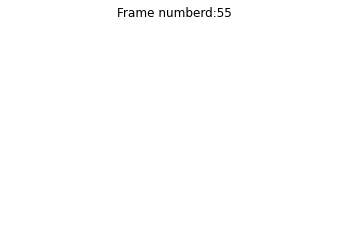

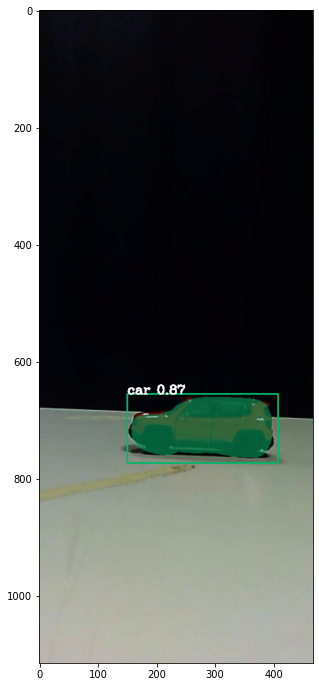

[3]
rois is: [[655 150 773 407]]
[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]
61
62
63
64
65
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000


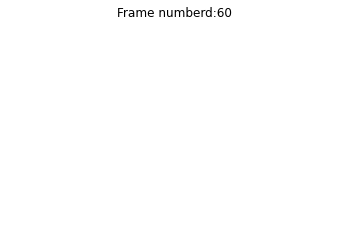

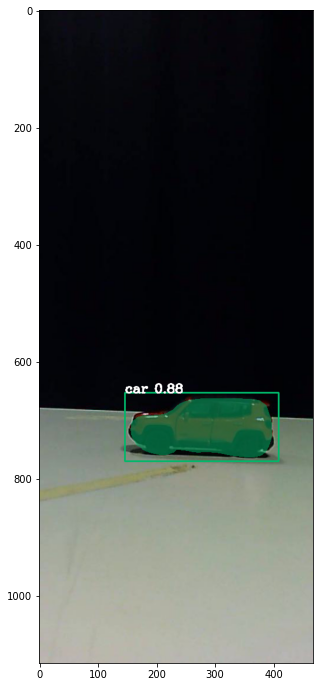

[3]
rois is: [[653 146 770 408]]
[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]
66
67
68
69
70
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000


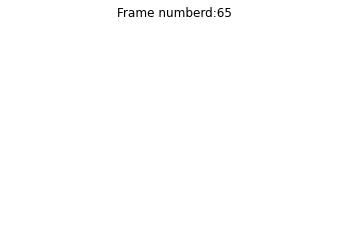

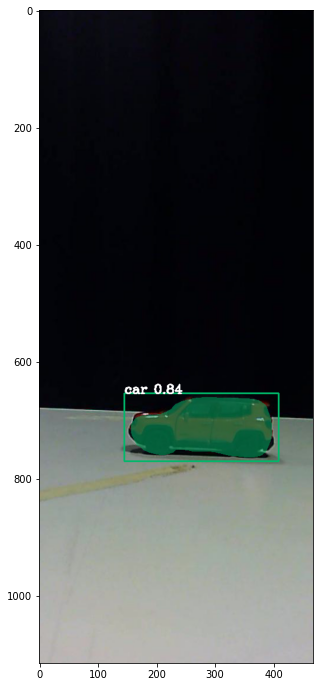

[3]
rois is: [[654 145 770 408]]
[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]
71
72
73
74
75
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000


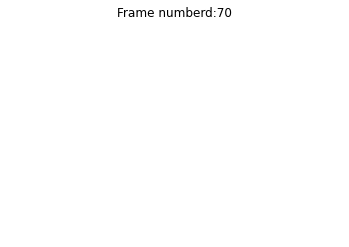

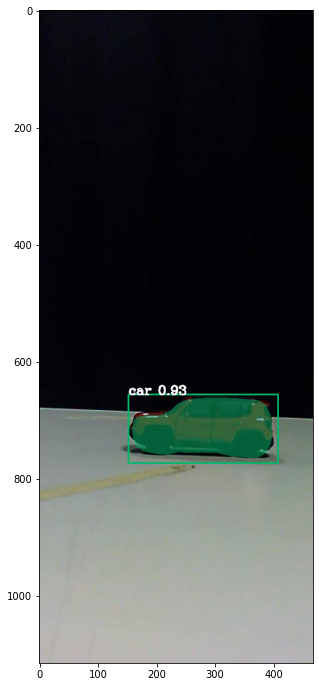

[3]
rois is: [[656 152 773 407]]
[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]
76
77
78
79
80
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000


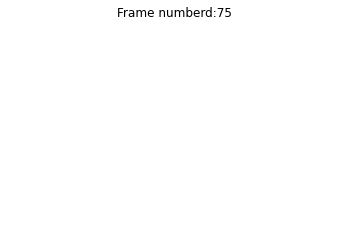

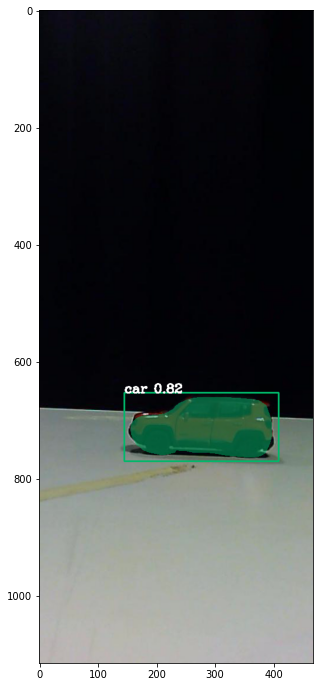

[3]
rois is: [[653 145 770 408]]
[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]
81
82
83
84
85
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000


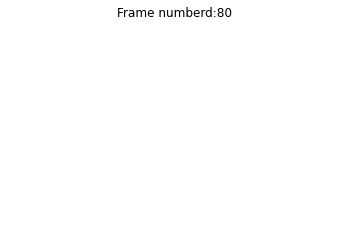

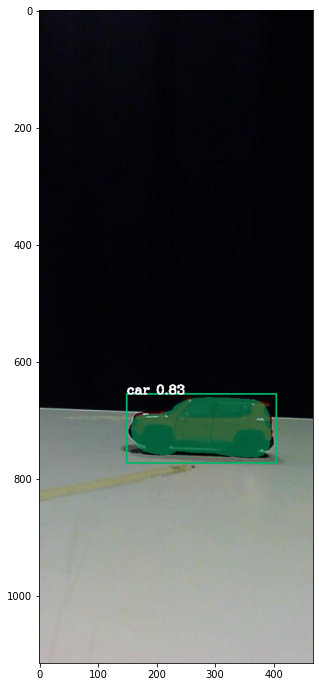

[3]
rois is: [[655 149 773 404]]
[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]
86
87
88
89
90
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000


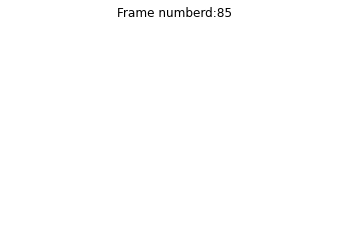

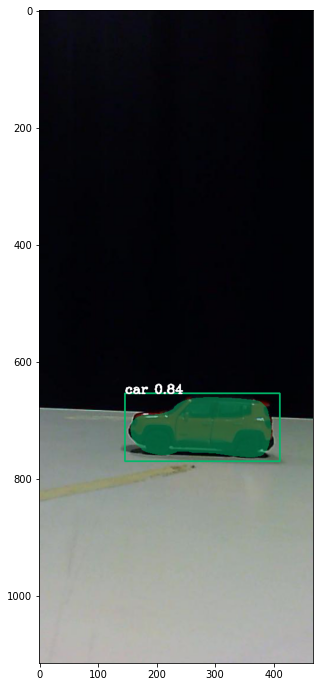

[3]
rois is: [[654 146 770 410]]
[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]
91
92
93
94
95
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000


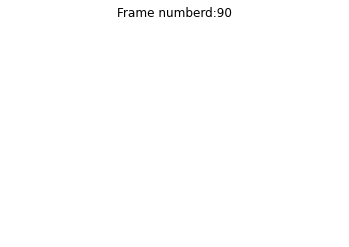

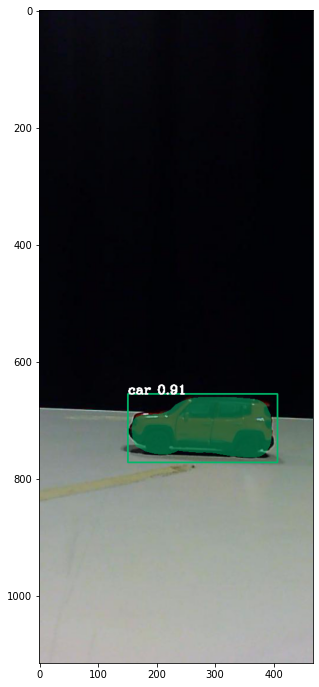

[3]
rois is: [[655 151 772 406]]
[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]
96
97
98
99
100
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000


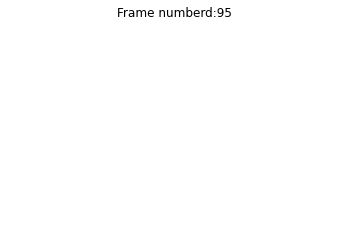

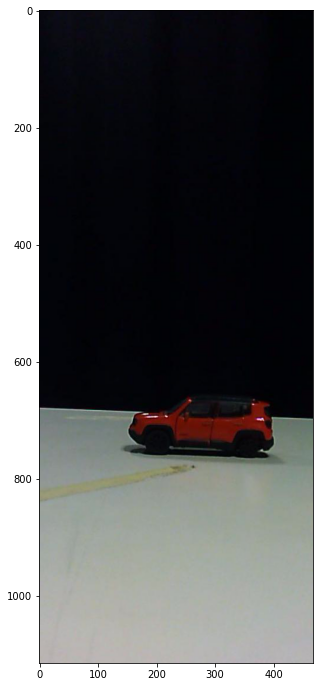

[]
rois is: []
[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]
101
102
103
104
105
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000


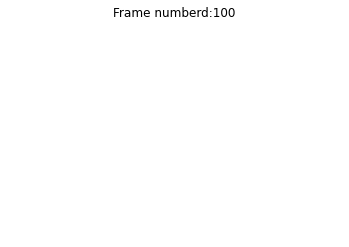

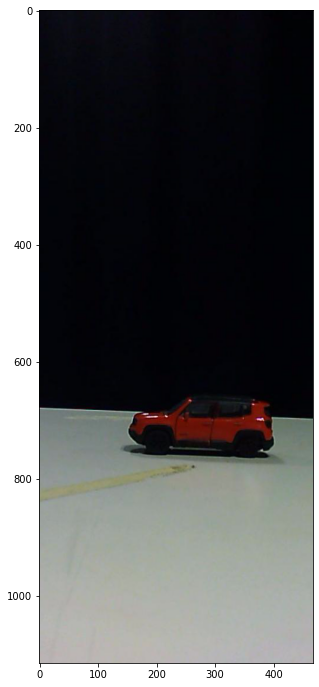

[]
rois is: []
[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]
106
107


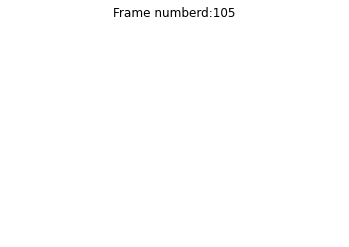

In [50]:
import importlib
import visualize_cv
importlib.reload(visualize_cv)
from visualize_cv import display_instances
from visualize_cv import display_instances_roi

dir= r'C:\Users\yair1\Desktop\CE final project\from_michael\VIDEO10'
##dir = r'C:\Users\michael kadosh\Desktop\Trak and car\scen_1'
capture = cv2.VideoCapture(dir + '/RecCam_3_7.avi')
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter(dir + '/Segmantation_video.avi', fourcc, 1, (467,1115))
class_ids_list = np.empty(shape=(0,120), dtype=int)
count = 0
fs = 5 # sampeling rate
while (True):
    ret, frame = capture.read()
    if (ret == True):
        if count %fs == 0:
        #if count %fs == 0 and count>40:
            ref_image = frame
            results = model.detect([frame], verbose=1)
            if count == fs*2:
                results1 = model.detect([frame], verbose=1)
            r = results[0]
            
            frame, df, aaa = display_instances(frame, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'],r['class_ids'])
            plt.figure(figsize=(14,12))
            plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
            plt.show()
            plt.title('Frame numberd:{:.0f}'.format(count))
            plt.axis(False)
            plt.axis("off")
            class_ids_list = np.append(class_ids_list, r['class_ids'])
            out.write(frame)
            print(r['class_ids'])
            print('rois is:',r['rois'])
            print(class_ids_list)
        count = count + 1
        print(count)

    else: 
        break
    

# cv2.imshow('frame', frame)
# cv2.waitKey(30) & 0xFF == ord('q'):
# break
out.set(cv2.CAP_PROP_FPS,3)
capture.release()
out.release()
cv2.destroyAllWindows()
class_ids_list = list(dict.fromkeys(class_ids_list))## remove duplicates class in the class id list

In [51]:
#class_ids_list = [ 1 ,67, 34]


### New list of class names for the reconstracted video 

In [52]:
import os
import sys
import random
import math
import numpy as np
import skimage.io
import matplotlib
import coco
import utils
import model as modellib
import visualize
import cv2
import matplotlib.pyplot as plt
from PIL import Image
from InI_vid import sensetivity1
from InI_vid import back_proj
from InI_vid import resolution
from InI_vid import gkern
from InI_vid import AGMR
from InI_vid import ReconstructedVideo
from skimage import measure, io, img_as_ubyte
import matplotlib.pyplot as plt
from skimage.color import label2rgb, rgb2gray
import pandas as pd
import scipy.ndimage
from scipy.signal import find_peaks
from scipy.signal import chirp, find_peaks, peak_widths
from scipy.signal import find_peaks, peak_prominences
from visualize_cv import display_instances_tube
from visualize_cv import display_instances
from scipy.signal import savgol_filter

In [53]:
def ROI_AGMR( boxes, mask, ids, class_names, G, zg, lensx, lensy, zmin, zmax, EI, deltax, deltay, PixelSize):
    
    z = resolution(zg, L, deltax, zmin, zmax)
    z= np.array(z).flatten()
    num_instances = boxes.shape[0]
    Results = []
    label = []
    agmr_roi = np.zeros([z.size,num_instances])## Every columns in "agmr_roi" contin the AGMR value for undividual object
    agmr= np.zeros([z.size,num_instances])## Every columns in "agmr_roi" contin the AGMR value for undividual object

    max_agmr =  np.zeros([num_instances])  ## the size of this vector is the same as the the number of objects.
    AGMR = np.zeros([z.size])
    for q in range(num_instances):  # Number of objects  in the current frame
        
        if not np.any(boxes[q]):
            continue

        y1, x1, y2, x2 = boxes[q] # RoI boxes size
        #crop_img = np.zeros(EI.shape)
        x1 = np.int(x1 * 0.85) 
        y1 = np.int(y1 * 0.85)
        y2 = np.int(y2 * 1.2)
        x2 = np.int(x2 * 1.2)
        #label = names[ids[q]]  # class name of the object in the ROI
        #Agmr = np.zeros(z.size)
        h = gkern(l=3, sig=1.)
        for i in range(0, len(z)):
            M = zg / z[i]
            F = back_proj(EI, G, deltax, deltay, lensx, lensy, PixelSize, M)
            S = sensetivity1(EI, deltax, deltay, lensx, lensy, PixelSize, M)
            F = np.array(F)
            S = np.array(S)
            f = F / S
            f = np.uint8(f)
            #for q in range(num_instances):  # Number of objects  in the current frame
            #    if not np.any(boxes[q]):
            #   continue
            #   y1, x1, y2, x2 = boxes[q] 
                 #f = scipy.ndimage.filters.convolve(f[0, :, :], h, mode='constant')
                #crop_img = crop_img[y1:y2, x1:x2] + f[y1:y2, x1:x2] 
            f = scipy.ndimage.filters.convolve(f[0, :, :], h, mode='constant')
            crop_img =  f[y1:y2, x1:x2]  # crop the frame for calculate the AGMR of the ROI
            color = (255,0,0)
            image = cv2.rectangle(f, (x1, y1), (x2, y2), color , 2)
            #plt.figure(figsize=(10,7))
            #plt.imshow(image, cmap=plt.cm.gray)
            #plt.axis(False)
            #plt.show()
            #plt.figure(figsize=(10,7))
            #plt.imshow(crop_img, cmap=plt.cm.gray)
            #plt.axis(False)
            #plt.show()
            grad_x = cv2.Sobel(crop_img, cv2.CV_64F, 1, 0, ksize=1)
            grad_y = cv2.Sobel(crop_img, cv2.CV_64F, 0, 1, ksize=1)
            abs_grad_x = cv2.convertScaleAbs(grad_x)
            abs_grad_y = cv2.convertScaleAbs(grad_y)
            grad = cv2.addWeighted(abs_grad_x, 0.5, abs_grad_y, 0.5, 0)
            # grad = cv2.Canny(image=f, threshold1=30, threshold2=120)
            #plt.imshow(grad, cmap=plt.cm.gray)
            #plt.show()
            AGMR_ave = np.mean(grad)
            agmr_roi[i,q] = AGMR_ave
        agmr[:,q] = agmr_roi[:,q]
        max_agmr[q] = np.amax( agmr_roi[:,q])
        label.append(class_names[ids[q]])# class name of the object in the ROI
        Results.append({
            "AGMR_ROI": agmr,
            "MAX_AGMR": max_agmr,
            "Label": label
            
        })
        #locs, val_max = find_peaks(Agmr, height=0)
        #v = np.array(list(val_max.items()))
        #val_max = np.array(v[0, 1], dtype=np.float)
        #Zpeaks = z[locs]
        #agmr_roi[:, q] = Agmr
        max_agmr[q] = np.max(agmr_roi[q,:])
        #[fig, axes] = plt.subplots(nrows = 1, ncols = num_instances, figsize=(14, 10))
        #ax = axes.ravel()
        #ax[q].plot(z,agmr_roi[:, q], linewidth=5 )
        #ax[q].plot(Zpeak,np.array(val_max),'ro',markersize=12)
        #ax[q].set_ylabel('AGMR')
        #ax[q].set_xlabel('[mm]')
        #ax[q].grid()
        #ax[q].set_title(label)
    #fig.canvas.draw()
    #fig.tight_layout()
    #plt.show()
    return [agmr_roi,max_agmr,z,Results]

def plot_AGMR_graph(Results, num_objects,G, EI, deltax, deltay, lensx, lensy, PixelSize, zg, h,claas_name,ref_frame,seg_elemental_frame,frame_num,main_frame):
    print("num_objects is:",num_objects)
    r = Results[0]
    AGMR_ROI = r["AGMR_ROI"]
    max_agmr = r["MAX_AGMR"]
    boj_inf = []
    label = r["Label"]
    real_distances1 = []
    #if num_objects == 1|0:
    if num_objects == 1:
        [fig, axes] = plt.subplots(nrows=1, ncols=2, figsize=(10, 7),dpi=200)
        fig.subplots_adjust(bottom=0.2, top=0.7)

        
        ax = axes.ravel()
        ax[0].plot(z, AGMR_ROI[:,0],linewidth=2 )
        ax[0].plot(z[np.where(AGMR_ROI[:,0] == np.amax(AGMR_ROI[:,0]))][0], np.amax(AGMR_ROI[:,0]), 'ro',markersize=12)
        ax[0].set_title(label[0])
        ax[0].set_ylabel('AGMR')
        ax[0].set_xlabel('[mm]')
        ax[0].grid()
        z_loc = z[np.where(AGMR_ROI[:,0] == np.amax(AGMR_ROI[:,0]))]
        dist = np.array(z_loc[0])
        real_distances1.append(int(z_loc[0]))
        print("AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA" + str(dist))
        M = zg / z_loc
        F = back_proj(EI, G, deltax, deltay, lensx, lensy, PixelSize, M)
        S = sensetivity1(EI, deltax, deltay, lensx, lensy, PixelSize, M)
        F = np.array(F)
        S = np.array(S)
        f = F / S
        f = np.uint8(f)
        Int_Img = scipy.ndimage.filters.convolve(f[0, :, :], h, mode='constant')
        Int_Img = cv2.cvtColor(Int_Img,cv2.COLOR_GRAY2RGB)
        ax[1].imshow(Int_Img, cmap=plt.cm.gray)
        ax[1].set_title(label[0] + str(z_loc) +"[mm]")
        fig2=fig
        re = seg_elemental_frame[0]
        frame, df = display_instances_roi(Int_Img, main_frame, re['rois'][0], re['masks'][:,:,0], re['class_ids'][0], class_names, re['scores'][0],ref_frame,frame_num, distance=dist)
        boj_inf.append(df)
        person =frame
    else:   
        [fig, axes] = plt.subplots(nrows=1, ncols=num_objects, figsize=(14, 10),dpi=200)
        fig.subplots_adjust(bottom=0.2, top=0.7)
        #fig.tight_layout()
        for i in range (num_objects) :
            ax = axes.ravel()
            #print("i is:",i)
            
            agmr = savgol_filter(AGMR_ROI[:,i],31,6)
            z_loc = z[np.where(agmr == np.amax(agmr))]
            ax[i].plot(z, agmr/np.max(agmr),linewidth=2 )
            #print( z[np.where(AGMR_ROI[:,i] == np.amax(AGMR_ROI[:,i]))] , np.amax(AGMR_ROI[:,i]))
            ax[i].plot(z[np.where(agmr == np.amax(agmr))][0], np.amax(agmr)/np.max(agmr), 'ro',markersize=12)
            
            ax[i].set_title(label[i] +"-"+str(z_loc[0]) +"[mm]",fontsize=16)
            print("ad matai oniversitat ben gurion!!!!!!!!!!!!!!!!!      "+str(z_loc[0]))
            real_distances1.append(int(z_loc[0]))
            ax[0].set_ylabel('ROI tube AGMR',fontsize=16)
            ax[i].tick_params(axis='x', labelsize=13)
            ax[i].tick_params(axis='y', labelsize=13)
            ax[i].set_xlabel('Distance [mm]',fontsize=16)
            ax[i].grid()
        #[fig2, axes2] = plt.subplots(nrows=1, ncols=num_objects, figsize=(14, 10), dpi=200)
        [fig2, axes2] = plt.subplots(nrows=1, ncols=3, figsize=(14, 10), dpi=250)
        fig2.subplots_adjust(bottom=0.2, top=0.7)

        fig2.tight_layout(rect=[0, 0.03, 1, 0.97],pad=5.0)
        ax2 = axes2.ravel()
        for j in range (num_objects) :
        #for j in range (1) :
            print("fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk1")
            agmr2 =  savgol_filter(AGMR_ROI[:,0],31,6)
            z_loc = z[np.where(agmr2 == np.amax(agmr2))]

            dist = np.array(z_loc[0])
            print("BBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBB" + str(dist))
            M = zg / z_loc[0]
            F = back_proj(EI, G, deltax, deltay, lensx, lensy, PixelSize, M)
            S = sensetivity1(EI, deltax, deltay, lensx, lensy, PixelSize, M)
            F = np.array(F)
            S = np.array(S)
            f = F / S
            f = np.uint8(f)
            Int_Img = scipy.ndimage.filters.convolve(f[0, :, :], h, mode='constant')
            Int_Img = cv2.cvtColor(Int_Img,cv2.COLOR_GRAY2RGB)
            
            re = seg_elemental_frame[0]
            frame, df = display_instances_roi(Int_Img, main_frame, re['rois'][j], re['masks'][:,:,j], re['class_ids'][j], class_names, re['scores'][j],ref_frame,frame_num, distance=dist)
            if j==0:
                person =frame
            #display(df)
            boj_inf.append(df)
            display(boj_inf)
            ax2[0].imshow(cv2.cvtColor(main_frame, cv2.COLOR_BGR2RGB))
            ax2[0].set_title("Elemental frame",fontsize=18)
            ax2[0].axis("off")
 
            ax2[1].plot(z, agmr2/np.max(agmr2),linewidth=2 )
            #print( z[np.where(AGMR_ROI[:,i] == np.amax(AGMR_ROI[:,i]))] , np.amax(AGMR_ROI[:,i]))
            ax2[1].plot(z[np.where(agmr2 == np.amax(agmr2))][0], np.amax(agmr2)/np.max(agmr2), 'ro',markersize=12)
            
            print("whyyyyyyyyyyyyyyyyyyyyyyyyyyyyy" + str(z_loc[0]))
            ax2[1].set_title(label[0] +"-"+str(z_loc[0]) +"[mm]",fontsize=20)
            ax2[1].set_ylabel('ROI tube AGMR',fontsize=18)
            ax2[1].tick_params(axis='x', labelsize=13)
            ax2[1].tick_params(axis='y', labelsize=13)
            ax2[1].set_xlabel('Distance [mm]',fontsize=18)

            ax2[1].grid()
            
            
            ax2[2].imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
            ax2[2].set_title(label[0]+' at ' + str(z_loc[0]) +"[mm]",fontsize=18)
            ax2[2].axis("off")
    fig.canvas.draw()
    print("fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk2")
    # convert canvas to image
    AGMR_graph = np.fromstring(fig.canvas.tostring_rgb(), dtype=np.uint8,
            sep='')
    AGMR_graph  =  AGMR_graph.reshape(fig.canvas.get_width_height()[::-1] + (3,))

    # img is rgb, convert to opencv's default bgr
    AGMR_graph = cv2.cvtColor( AGMR_graph,cv2.COLOR_RGB2BGR)
    
    boj_inf = np.array(boj_inf)
    fig2.canvas.draw()

    # convert canvas to image
    REC_seg_img = np.fromstring(fig2.canvas.tostring_rgb(), dtype=np.uint8,
            sep='')
    REC_seg_img  = REC_seg_img.reshape(fig2.canvas.get_width_height()[::-1] + (3,))
    # img is rgb, convert to opencv's default bgr
    REC_seg_img = cv2.cvtColor(REC_seg_img,cv2.COLOR_RGB2BGR)
    
    #dict = {'Frame num':frame_num,'Lable': boj_inf[:,0], 'score': boj_inf[:,1], 'ROI ratio': boj_inf[:,2], 'mask ratio': boj_inf[:,3], 'Distance': boj_inf[:,4], 'c.m x': boj_inf[:,5], 'c.m y': boj_inf[:,6]}
    #df = pd.DataFrame(dict)
    #display(df)
    

    return[AGMR_graph,REC_seg_img, boj_inf, person, real_distances1 ]


|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
[ 4  7 11]
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000
num_objects is: 2
ad matai oniversitat ben gurion!!!!!!!!!!!!!!!!!      399
ad matai oniversitat ben gurion!!!!!!!!!!!!!!!!!      518
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk1
BBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBB399


[[5,
  'car',
  0.99657285,
  0.01537,
  0.011086,
  399,
  69.0,
  684.0,
  0.42028985507246375,
  400.95713853696327,
  array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
  655,
  0,
  713,
  138,
  'name',
  77.93461244317662,
  11.475637181409295,
  47.50912043978011,
  67.99987506246876,
  0.36965682752542567]]

whyyyyyyyyyyyyyyyyyyyyyyyyyyyyy399
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk1
BBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBB399


[[5,
  'car',
  0.99657285,
  0.01537,
  0.011086,
  399,
  69.0,
  684.0,
  0.42028985507246375,
  400.95713853696327,
  array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
  655,
  0,
  713,
  138,
  'name',
  77.93461244317662,
  11.475637181409295,
  47.50912043978011,
  67.99987506246876,
  0.36965682752542567],
 [5,
  'car',
  0.92169744,
  0.0578,
  0.03925,
  399,
  276.5,
  711.0,
  0.4627450980392157,
  1515.6693009588425,
  array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
  652,
  149,
  770,
  404,
  'name',
  59.05790016554623,
  4.444599534729146,
  9.63629112662014,
  36.22937853107344,
  0.2832983189475388]]

whyyyyyyyyyyyyyyyyyyyyyyyyyyyyy399
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk2


C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:210: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:216: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:221: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


26250000
Frame number: 5


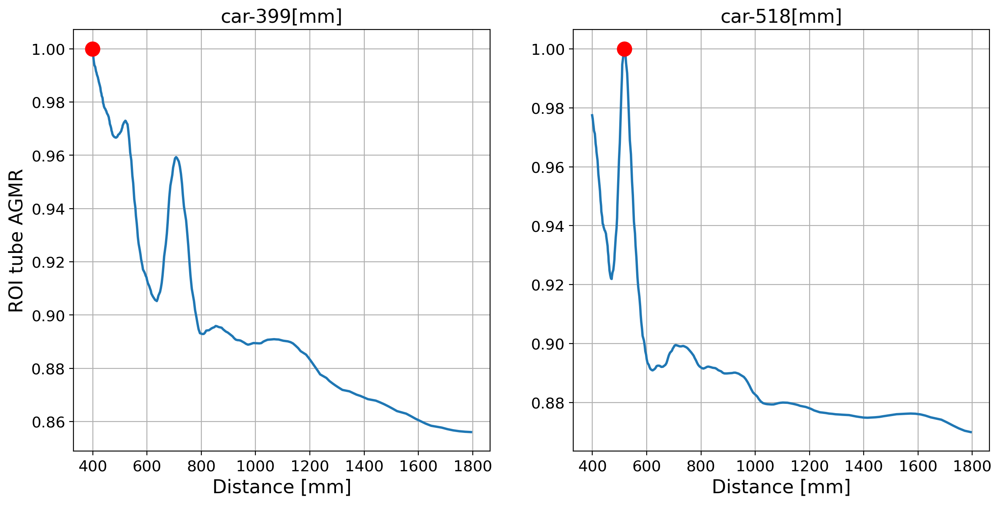

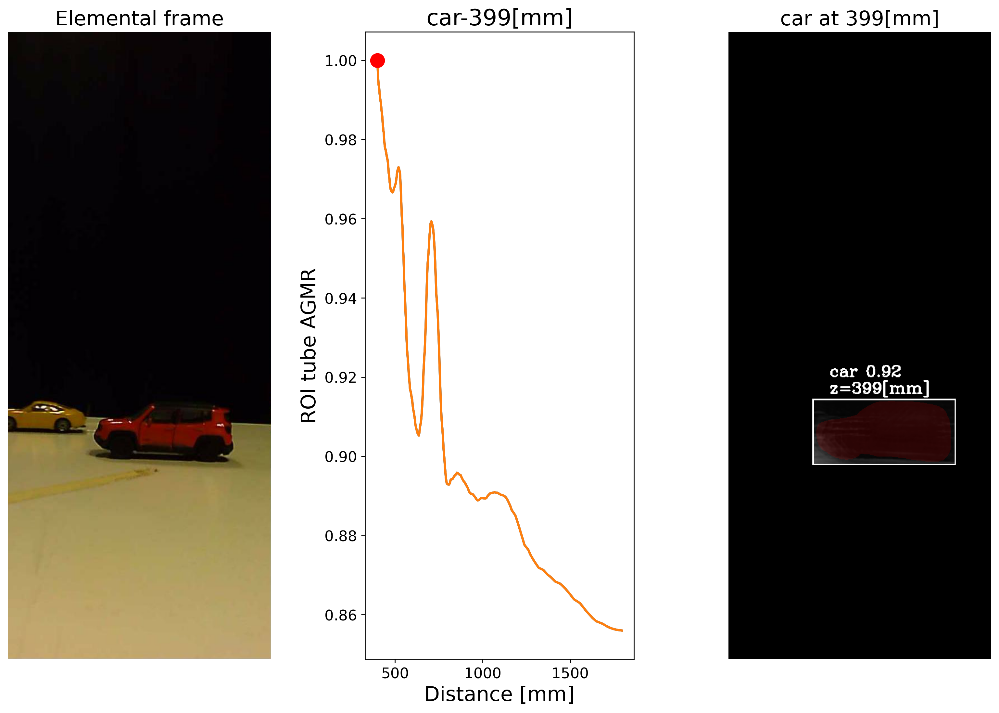

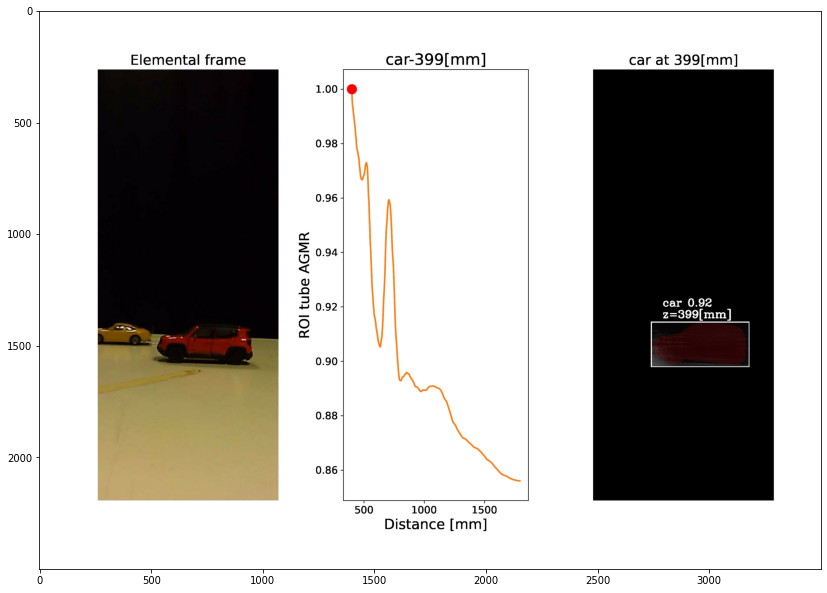

Elapsed time is 39.837994 seconds.
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
[ 4  7 12]
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000
num_objects is: 2
ad matai oniversitat ben gurion!!!!!!!!!!!!!!!!!      401
ad matai oniversitat ben gurion!!!!!!!!!!!!!!!!!      518
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk1
BBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBB401


[[10,
  'car',
  0.99651283,
  0.0186,
  0.01198,
  401,
  101.5,
  687.0,
  0.3236994219653179,
  430.7619849286516,
  array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
  659,
  15,
  715,
  188,
  'name',
  76.70963952483662,
  9.479562345169281,
  40.25454170107349,
  58.59104046242775,
  0.36144171099275013]]

whyyyyyyyyyyyyyyyyyyyyyyyyyyyyy401
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk1
BBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBB401


[[10,
  'car',
  0.99651283,
  0.0186,
  0.01198,
  401,
  101.5,
  687.0,
  0.3236994219653179,
  430.7619849286516,
  array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
  659,
  15,
  715,
  188,
  'name',
  76.70963952483662,
  9.479562345169281,
  40.25454170107349,
  58.59104046242775,
  0.36144171099275013],
 [10,
  'car',
  0.9468132,
  0.05655,
  0.03784,
  401,
  274.0,
  712.5,
  0.44921875,
  1459.8505081934416,
  array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
  655,
  146,
  770,
  402,
  'name',
  59.2213044047462,
  4.269395380434783,
  9.280129076086956,
  36.29915081521739,
  0.27777720904534986]]

whyyyyyyyyyyyyyyyyyyyyyyyyyyyyy401
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk2


C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:210: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:216: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:221: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


26250000
Frame number: 10


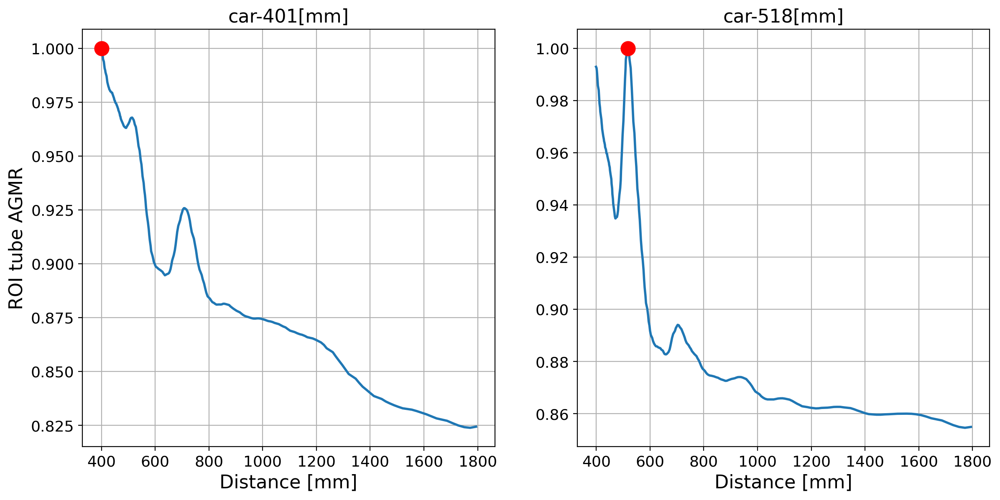

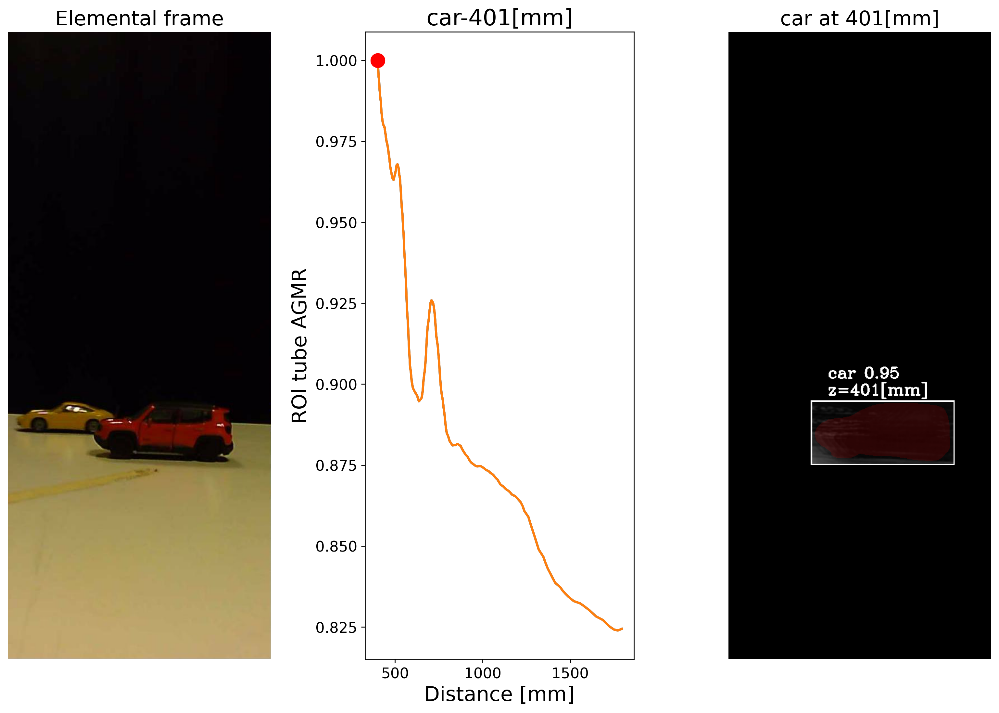

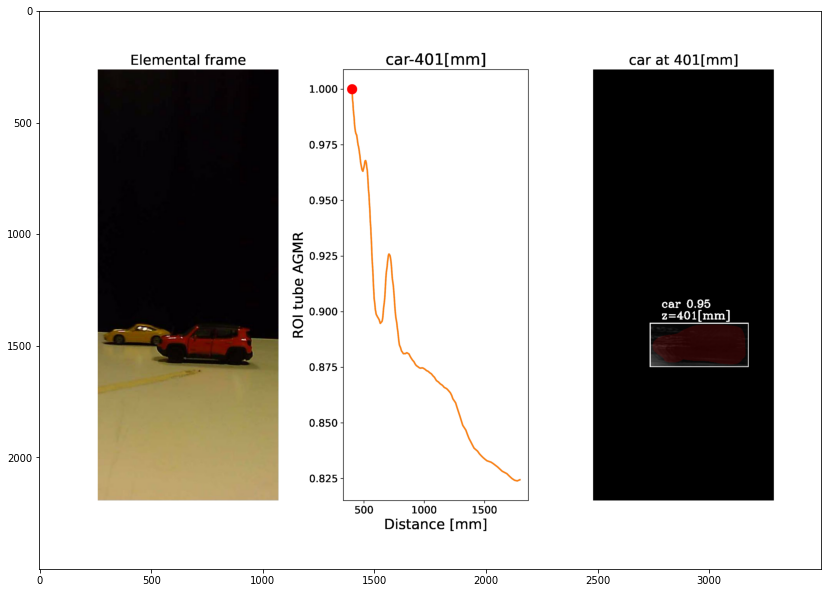

Elapsed time is 46.510009 seconds.
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
[ 4  7 11]
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000
num_objects is: 2
ad matai oniversitat ben gurion!!!!!!!!!!!!!!!!!      399
ad matai oniversitat ben gurion!!!!!!!!!!!!!!!!!      518
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk1
BBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBB399


[[15,
  'car',
  0.99283254,
  0.01557,
  0.00836,
  399,
  147.5,
  685.5,
  0.32075471698113206,
  286.8348300145524,
  array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
  660,
  68,
  711,
  227,
  'name',
  79.60755032724768,
  9.585522259218152,
  36.88284622024911,
  51.98088543593538,
  0.38461404775674346]]

whyyyyyyyyyyyyyyyyyyyyyyyyyyyyy399
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk1
BBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBB399


[[15,
  'car',
  0.99283254,
  0.01557,
  0.00836,
  399,
  147.5,
  685.5,
  0.32075471698113206,
  286.8348300145524,
  array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
  660,
  68,
  711,
  227,
  'name',
  79.60755032724768,
  9.585522259218152,
  36.88284622024911,
  51.98088543593538,
  0.38461404775674346],
 [15,
  'car',
  0.939616,
  0.0536,
  0.03833,
  399,
  276.5,
  712.5,
  0.4574898785425101,
  1475.9540093677053,
  array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
  656,
  153,
  769,
  400,
  'name',
  59.67050465754234,
  4.822363942531618,
  10.494106266346602,
  39.716384221274765,
  0.28172561104679644]]

whyyyyyyyyyyyyyyyyyyyyyyyyyyyyy399
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk2


C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:210: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:216: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:221: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


26250000
Frame number: 15


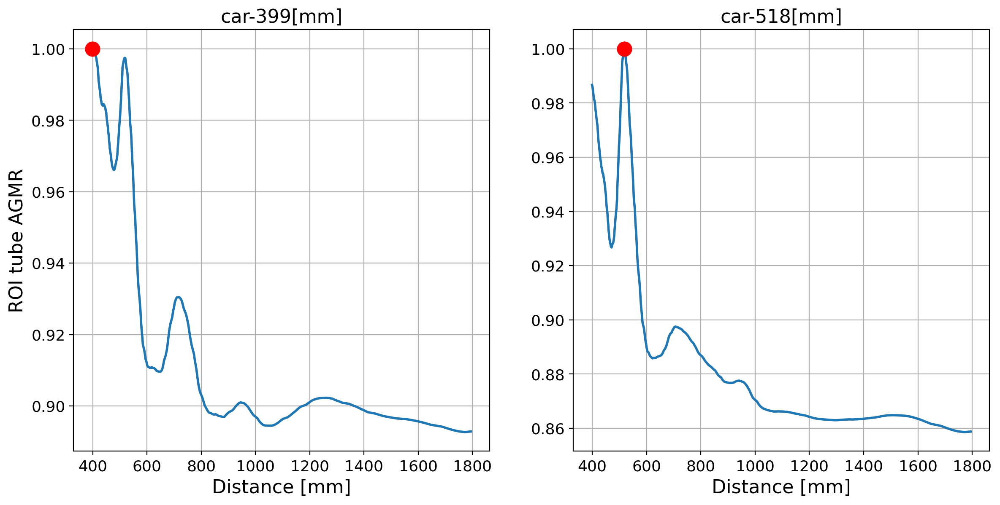

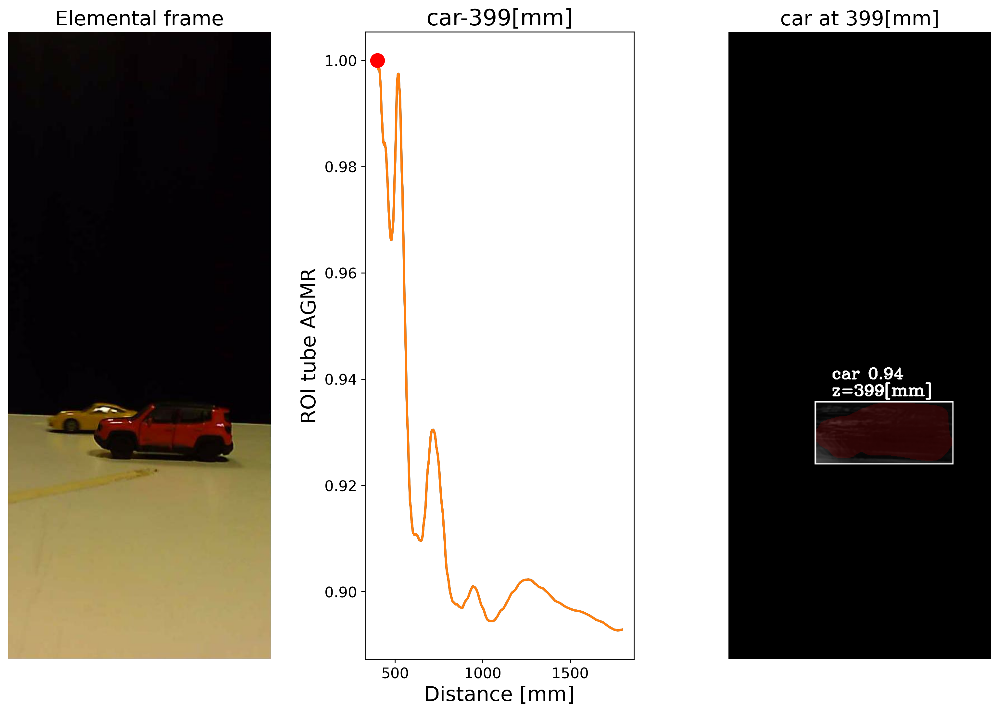

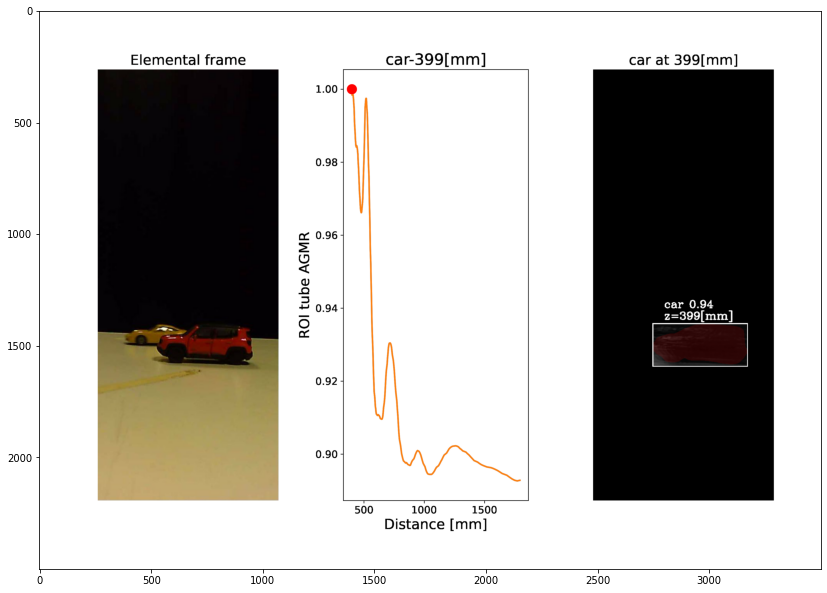

Elapsed time is 45.759243 seconds.
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
[3 7 8]
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000
num_objects is: 1
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA520
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk2
8400000
Frame number: 20


C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:210: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:216: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:221: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


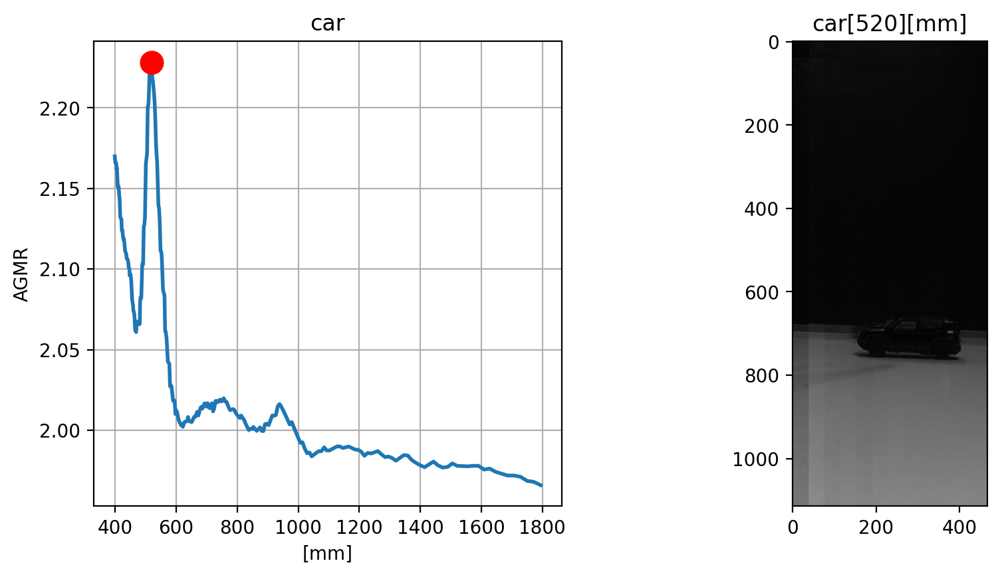

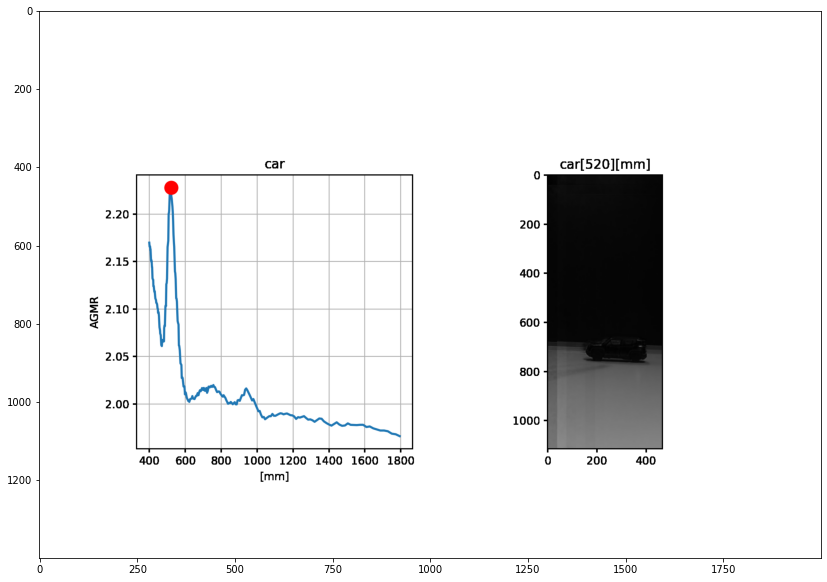

Elapsed time is 25.839809 seconds.
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
[ 3  6 11]
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000
num_objects is: 1
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA516
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk2
8400000
Frame number: 25


C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:210: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:216: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:221: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


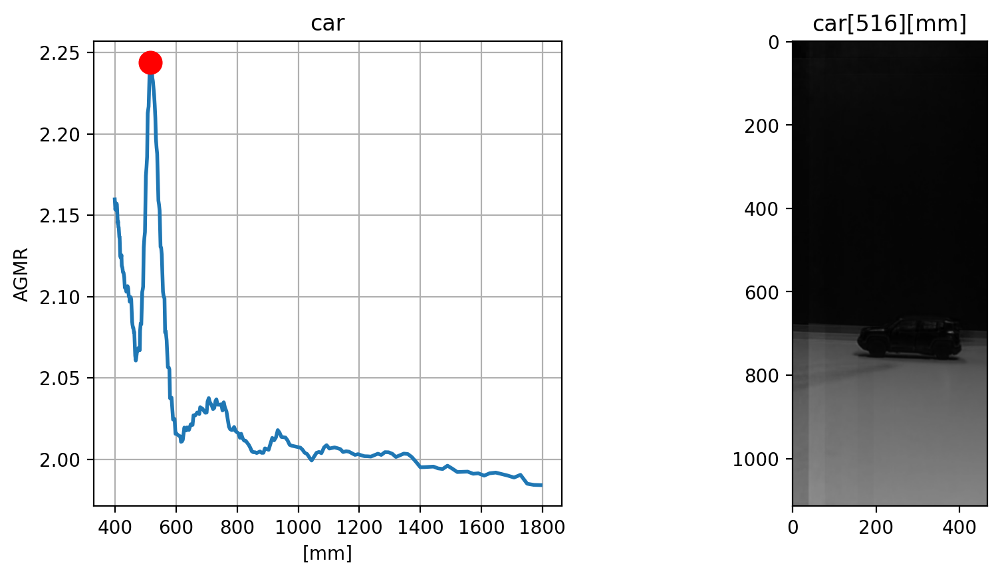

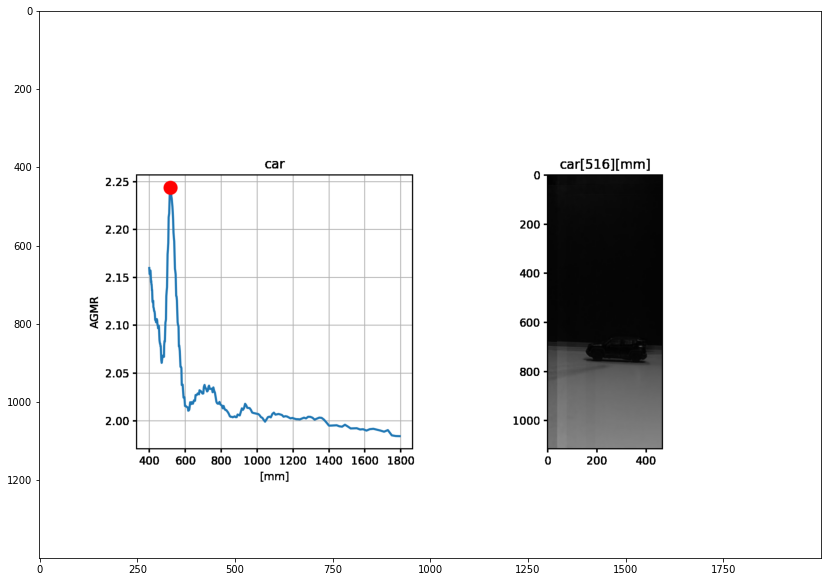

Elapsed time is 36.379619 seconds.
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
[13  9  8]
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  150.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000
num_objects is: 2
ad matai oniversitat ben gurion!!!!!!!!!!!!!!!!!      518
ad matai oniversitat ben gurion!!!!!!!!!!!!!!!!!      518
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk1
BBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBB518


[[30,
  'car',
  0.9417844,
  0.05643,
  0.0367,
  518,
  282.0,
  714.5,
  0.4346153846153846,
  1410.8463738263556,
  array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
  658,
  152,
  771,
  412,
  'name',
  60.24360936975668,
  9.311878829135466,
  13.019537100068073,
  32.815282505105515,
  0.46524742415033193]]

whyyyyyyyyyyyyyyyyyyyyyyyyyyyyy518
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk1
BBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBB518


[[30,
  'car',
  0.9417844,
  0.05643,
  0.0367,
  518,
  282.0,
  714.5,
  0.4346153846153846,
  1410.8463738263556,
  array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
  658,
  152,
  771,
  412,
  'name',
  60.24360936975668,
  9.311878829135466,
  13.019537100068073,
  32.815282505105515,
  0.46524742415033193],
 [30,
  'car',
  0.74395305,
  0.00448,
  0.002205,
  518,
  410.5,
  694.0,
  0.8301886792452831,
  65.65898322199781,
  array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
  672,
  384,
  716,
  437,
  'name',
  94.5323959691486,
  5.143224699828473,
  37.11835334476844,
  41.34648370497427,
  0.3868983947565609]]

whyyyyyyyyyyyyyyyyyyyyyyyyyyyyy518
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk2


C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:210: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:216: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:221: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


26250000
Frame number: 30


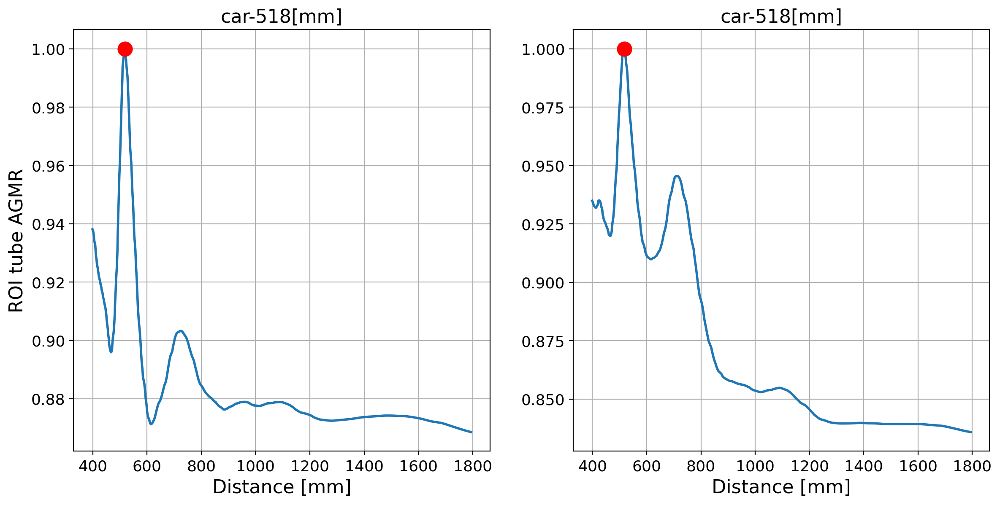

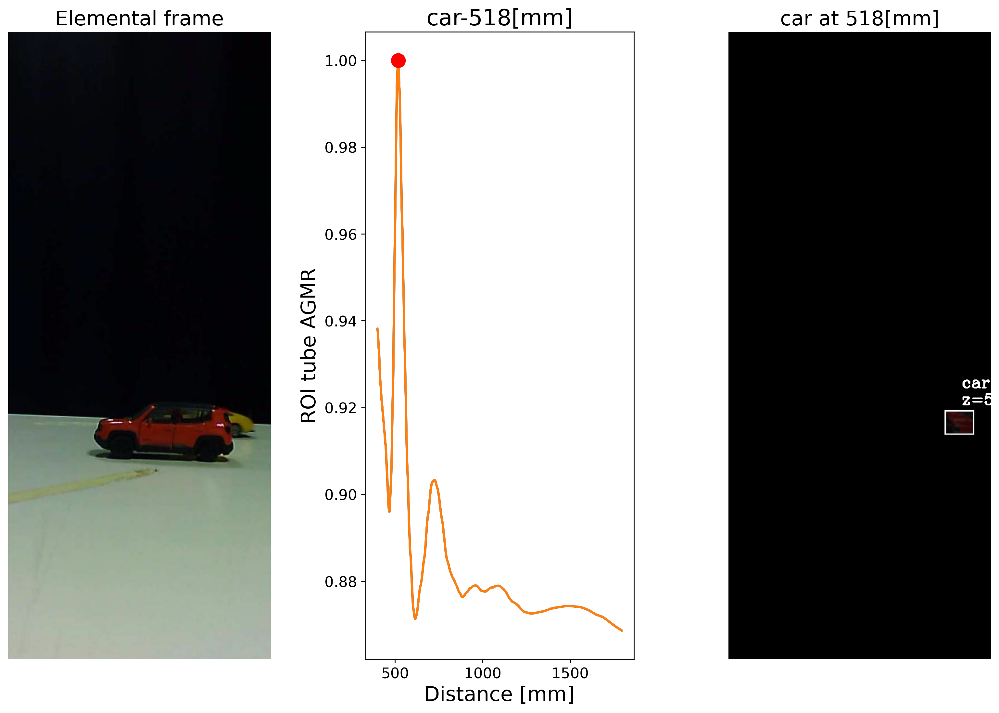

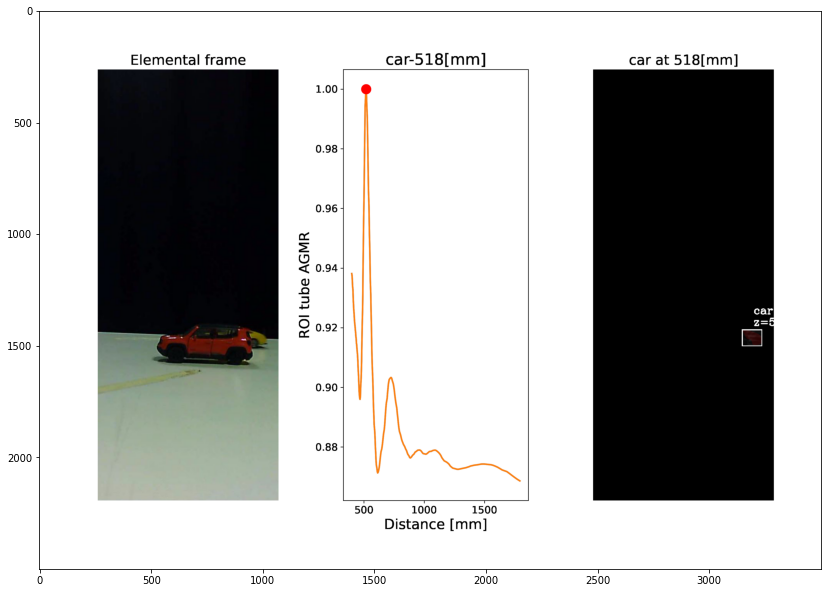

Elapsed time is 50.602798 seconds.
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
[14  9  6]
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000
num_objects is: 2
ad matai oniversitat ben gurion!!!!!!!!!!!!!!!!!      518
ad matai oniversitat ben gurion!!!!!!!!!!!!!!!!!      518
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk1
BBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBB518


[[35,
  'car',
  0.99433255,
  0.00829,
  0.00621,
  518,
  427.0,
  694.0,
  0.675,
  217.66794363855226,
  array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
  667,
  387,
  721,
  467,
  'name',
  84.44638918108805,
  10.419907407407408,
  55.350462962962965,
  62.10925925925926,
  0.4157332010310755]]

whyyyyyyyyyyyyyyyyyyyyyyyyyyyyy518
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk1
BBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBB518


[[35,
  'car',
  0.99433255,
  0.00829,
  0.00621,
  518,
  427.0,
  694.0,
  0.675,
  217.66794363855226,
  array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
  667,
  387,
  721,
  467,
  'name',
  84.44638918108805,
  10.419907407407408,
  55.350462962962965,
  62.10925925925926,
  0.4157332010310755],
 [35,
  'car',
  0.9499099,
  0.0575,
  0.0374,
  518,
  278.5,
  713.5,
  0.42641509433962266,
  1441.509734083134,
  array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
  657,
  146,
  770,
  411,
  'name',
  60.28098581843973,
  9.151845049256972,
  12.34954082484555,
  32.539155117715815,
  0.46728421532117653]]

whyyyyyyyyyyyyyyyyyyyyyyyyyyyyy518
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk2


C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:210: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:216: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:221: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


26250000
Frame number: 35


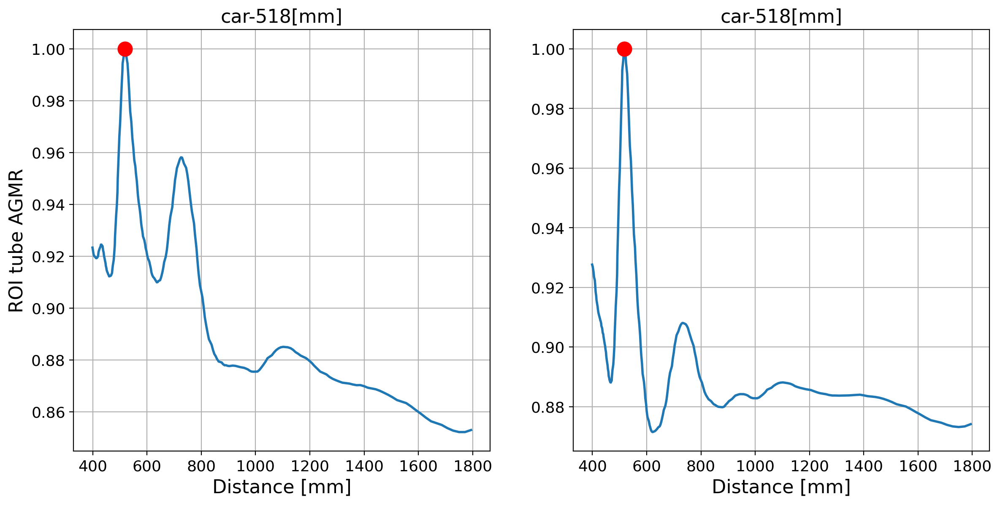

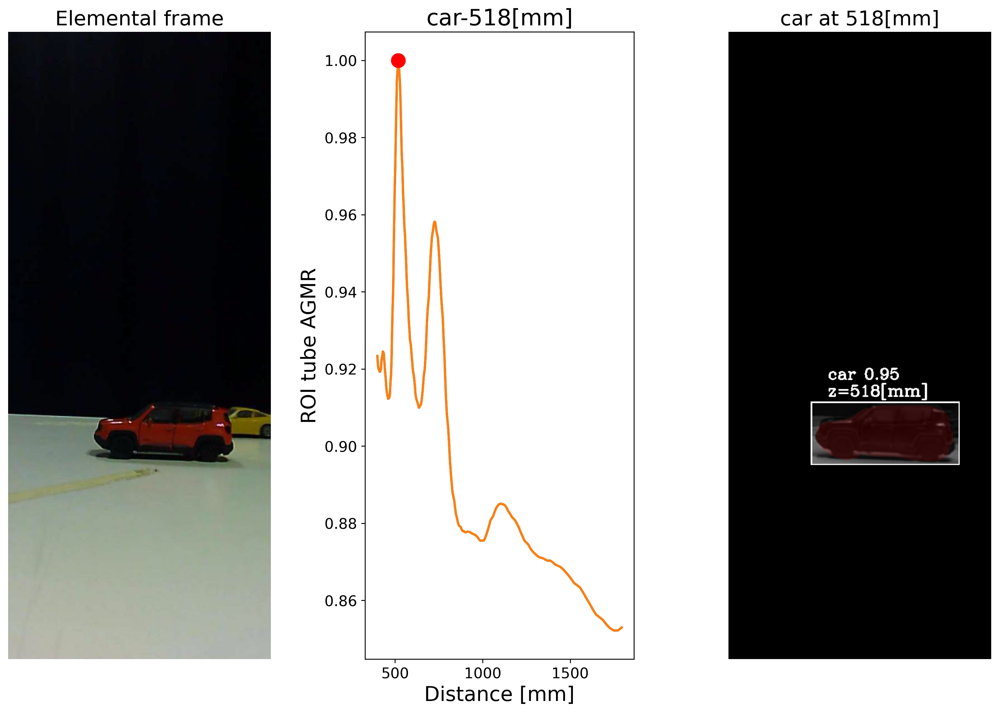

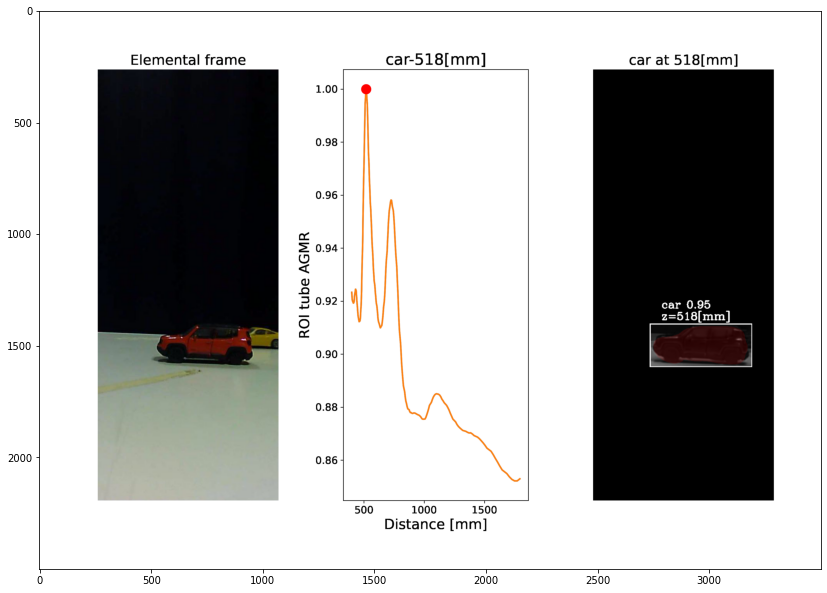

Elapsed time is 46.515953 seconds.
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
[18 10 10]
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000
num_objects is: 2
ad matai oniversitat ben gurion!!!!!!!!!!!!!!!!!      518
ad matai oniversitat ben gurion!!!!!!!!!!!!!!!!!      518
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk1
BBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBB518


[[40,
  'car',
  0.98378974,
  0.00778,
  0.00583,
  518,
  429.5,
  694.0,
  0.72,
  204.34844541915444,
  array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
  667,
  392,
  721,
  467,
  'name',
  84.84326264812832,
  11.768395061728395,
  50.28123456790124,
  58.080987654320985,
  0.4341269615770506]]

whyyyyyyyyyyyyyyyyyyyyyyyyyyyyy518
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk1
BBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBB518


[[40,
  'car',
  0.98378974,
  0.00778,
  0.00583,
  518,
  429.5,
  694.0,
  0.72,
  204.34844541915444,
  array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
  667,
  392,
  721,
  467,
  'name',
  84.84326264812832,
  11.768395061728395,
  50.28123456790124,
  58.080987654320985,
  0.4341269615770506],
 [40,
  'car',
  0.8991751,
  0.05853,
  0.0383,
  518,
  277.5,
  712.5,
  0.4339622641509434,
  1477.6265343178172,
  array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
  655,
  145,
  770,
  410,
  'name',
  60.087491016142074,
  9.362198523379819,
  12.123018867924529,
  32.99842493847416,
  0.47445484560880463]]

whyyyyyyyyyyyyyyyyyyyyyyyyyyyyy518
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk2


C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:210: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:216: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:221: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


26250000
Frame number: 40


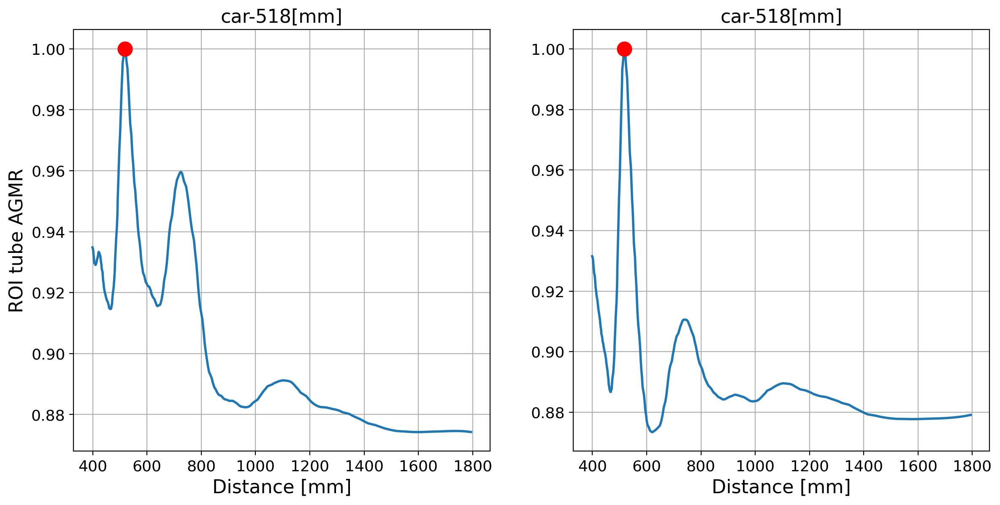

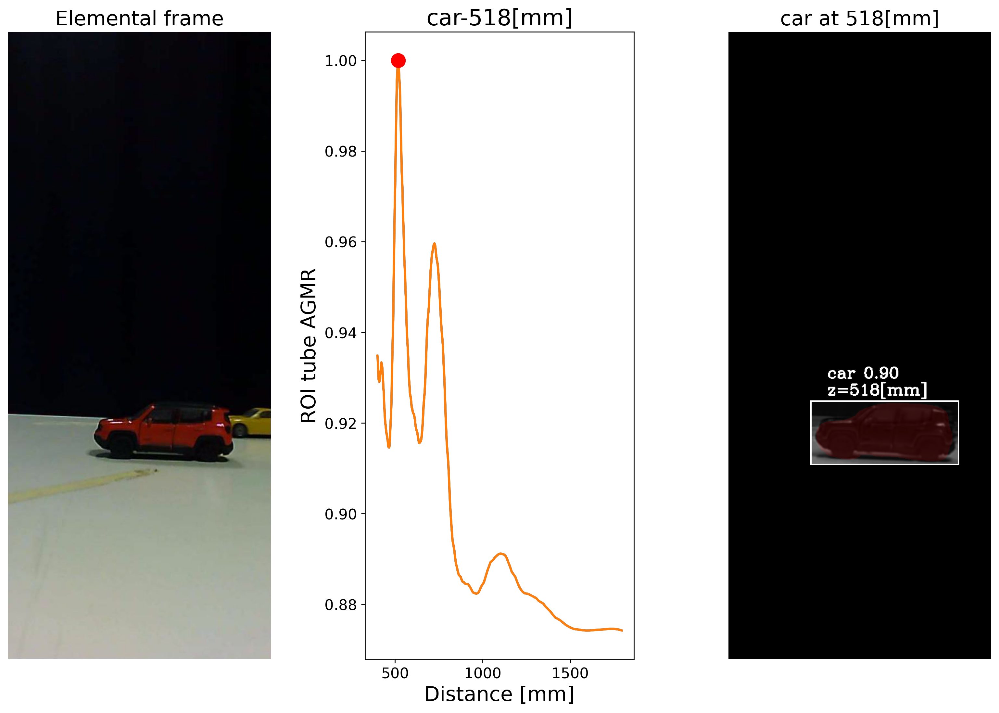

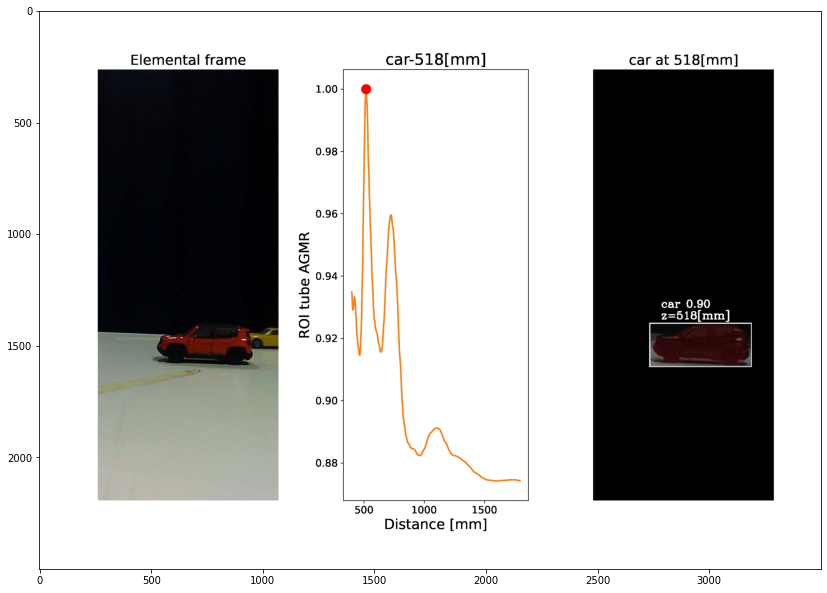

Elapsed time is 46.614299 seconds.
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
[14  9  8]
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000
num_objects is: 2
ad matai oniversitat ben gurion!!!!!!!!!!!!!!!!!      518
ad matai oniversitat ben gurion!!!!!!!!!!!!!!!!!      518
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk1
BBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBB518


[[45,
  'car',
  0.9968196,
  0.00461,
  0.00342,
  518,
  437.0,
  701.0,
  0.6666666666666666,
  113.44307570712796,
  array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
  681,
  407,
  721,
  467,
  'name',
  88.90545145511327,
  15.038333333333334,
  51.86625,
  59.16041666666667,
  0.4736152133862317]]

whyyyyyyyyyyyyyyyyyyyyyyyyyyyyy518
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk1
BBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBB518


[[45,
  'car',
  0.9968196,
  0.00461,
  0.00342,
  518,
  437.0,
  701.0,
  0.6666666666666666,
  113.44307570712796,
  array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
  681,
  407,
  721,
  467,
  'name',
  88.90545145511327,
  15.038333333333334,
  51.86625,
  59.16041666666667,
  0.4736152133862317],
 [45,
  'car',
  0.9377913,
  0.057,
  0.0374,
  518,
  277.5,
  713.0,
  0.4226415094339623,
  1441.4191583698896,
  array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
  657,
  145,
  769,
  410,
  'name',
  60.32752228426372,
  9.441206199460916,
  12.18133423180593,
  33.79780997304582,
  0.4716055879772294]]

whyyyyyyyyyyyyyyyyyyyyyyyyyyyyy518
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk2


C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:210: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:216: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:221: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


26250000
Frame number: 45


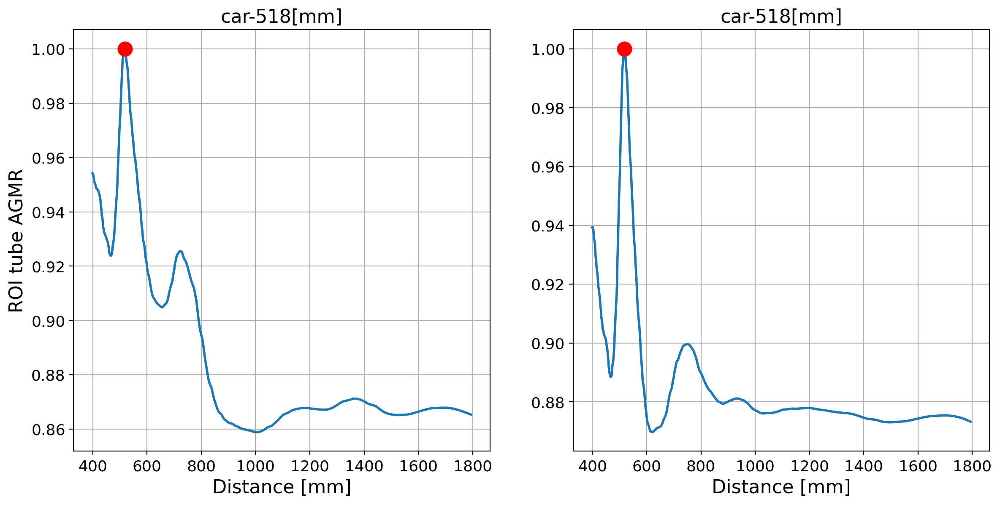

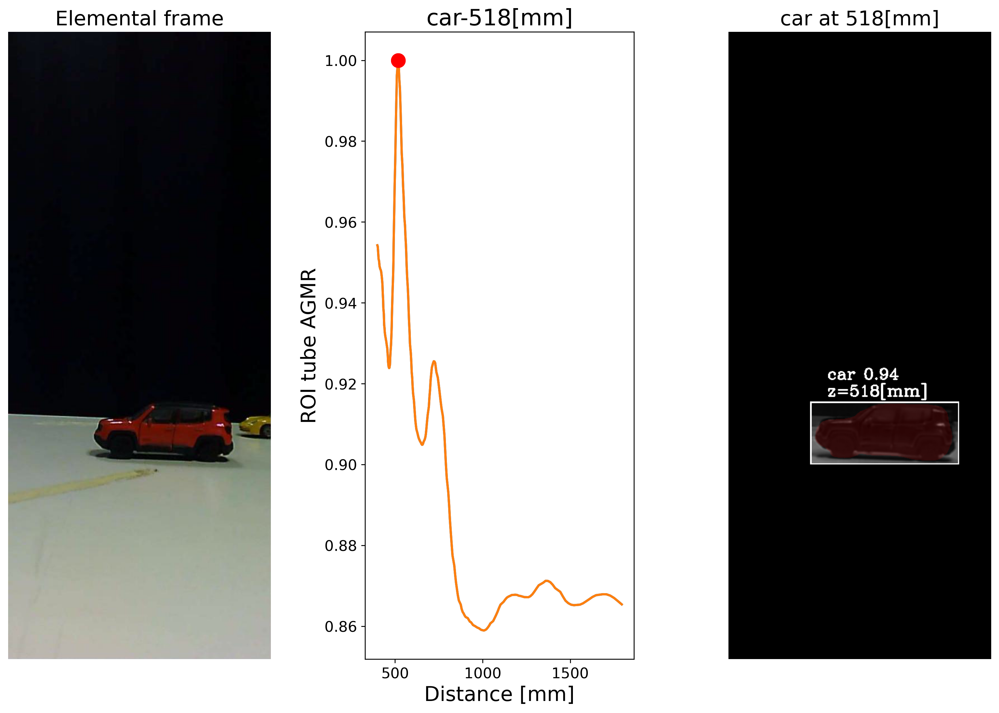

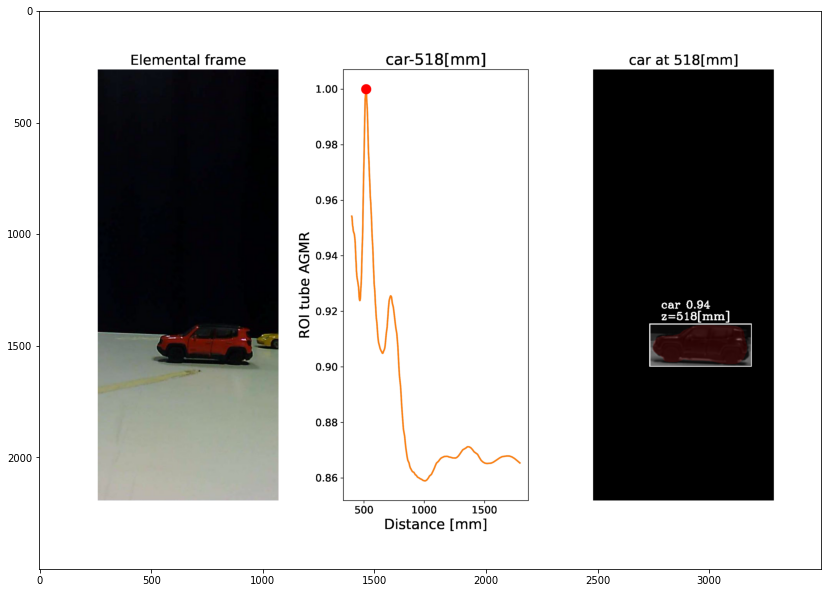

Elapsed time is 39.736548 seconds.
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
[15 10  9]
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000
num_objects is: 2
ad matai oniversitat ben gurion!!!!!!!!!!!!!!!!!      516
ad matai oniversitat ben gurion!!!!!!!!!!!!!!!!!      518
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk1
BBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBB516


[[50,
  'car',
  0.9775634,
  0.002344,
  0.001798,
  516,
  450.5,
  701.5,
  1.121212121212121,
  55.25920028308563,
  array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
  683,
  434,
  720,
  467,
  'name',
  97.08993198875051,
  18.755118755118755,
  60.42833742833743,
  66.80753480753481,
  0.49853899538086827]]

whyyyyyyyyyyyyyyyyyyyyyyyyyyyyy516
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk1
BBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBBB516


[[50,
  'car',
  0.9775634,
  0.002344,
  0.001798,
  516,
  450.5,
  701.5,
  1.121212121212121,
  55.25920028308563,
  array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
  683,
  434,
  720,
  467,
  'name',
  97.08993198875051,
  18.755118755118755,
  60.42833742833743,
  66.80753480753481,
  0.49853899538086827],
 [50,
  'car',
  0.7631123,
  0.0561,
  0.037,
  516,
  279.0,
  712.5,
  0.452755905511811,
  1422.8410324114086,
  array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
  655,
  152,
  770,
  406,
  'name',
  60.06793788825407,
  9.389558370421089,
  12.172030126668949,
  34.21160561451558,
  0.4672154659477947]]

whyyyyyyyyyyyyyyyyyyyyyyyyyyyyy516
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk2


C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:210: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:216: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:221: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


26250000
Frame number: 50


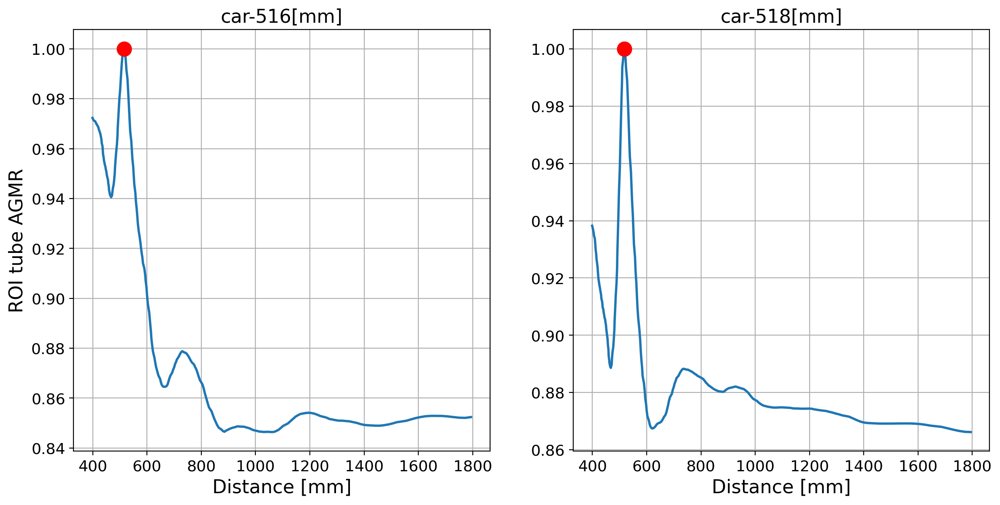

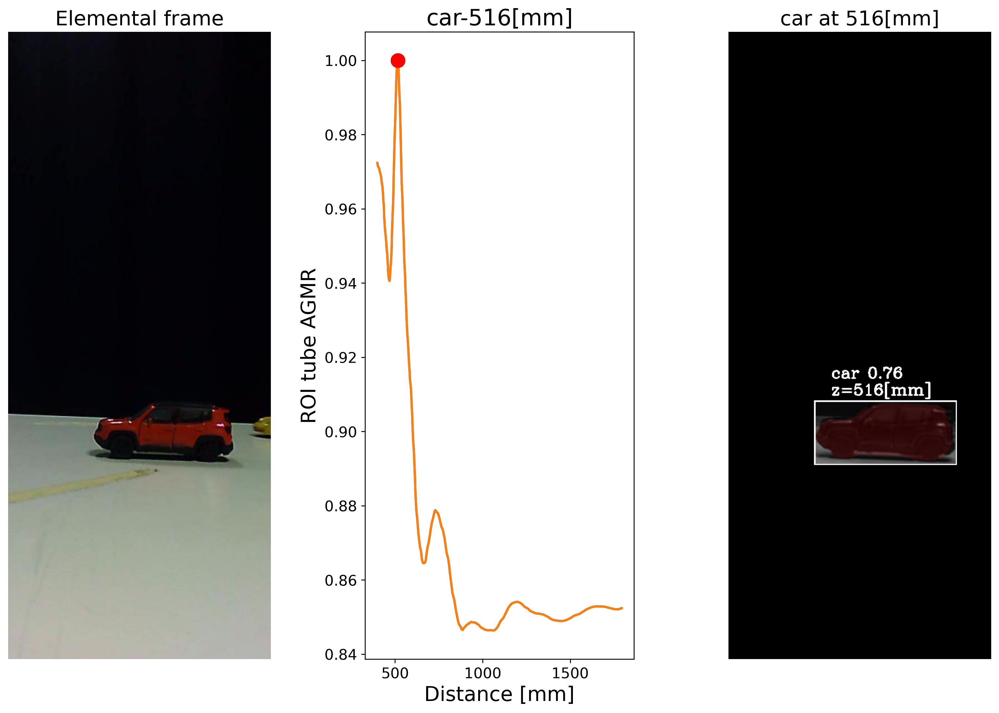

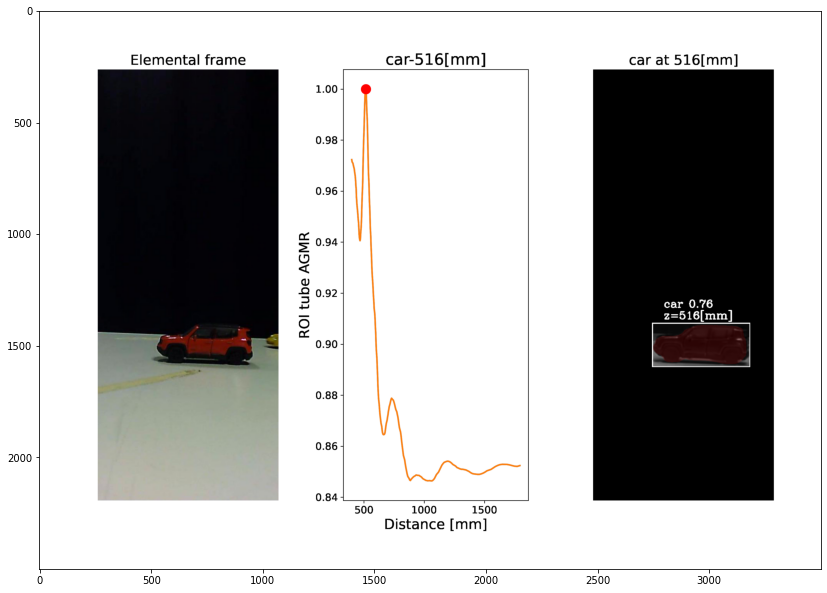

Elapsed time is 40.005202 seconds.
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
[17 12 11]
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000
num_objects is: 1
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA514
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk2
8400000
Frame number: 55


C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:210: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:216: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:221: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


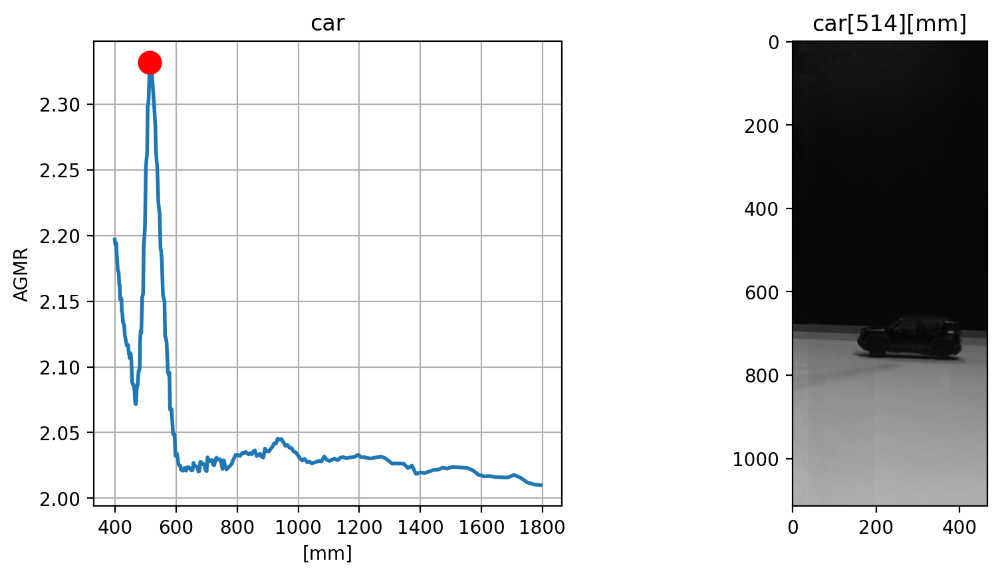

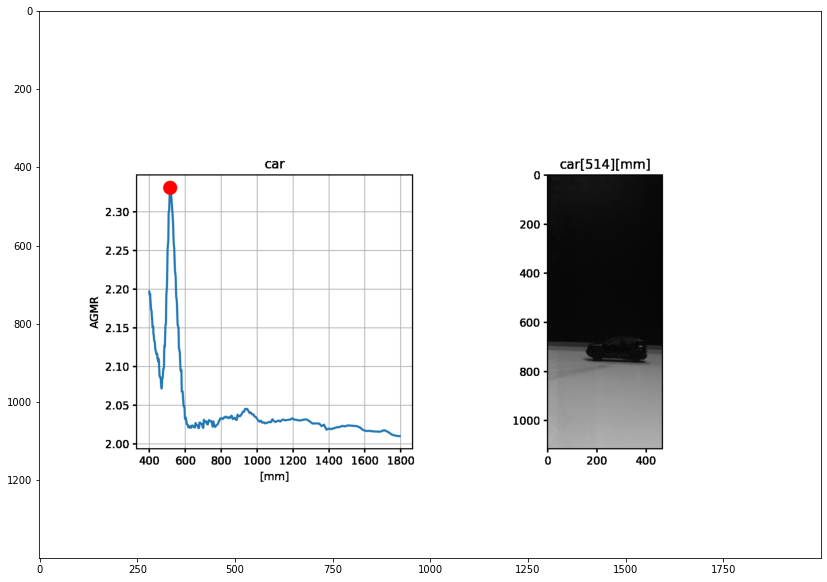

Elapsed time is 24.078721 seconds.
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
[14  9 10]
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000
num_objects is: 1
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA514
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk2
8400000
Frame number: 60


C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:210: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:216: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:221: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


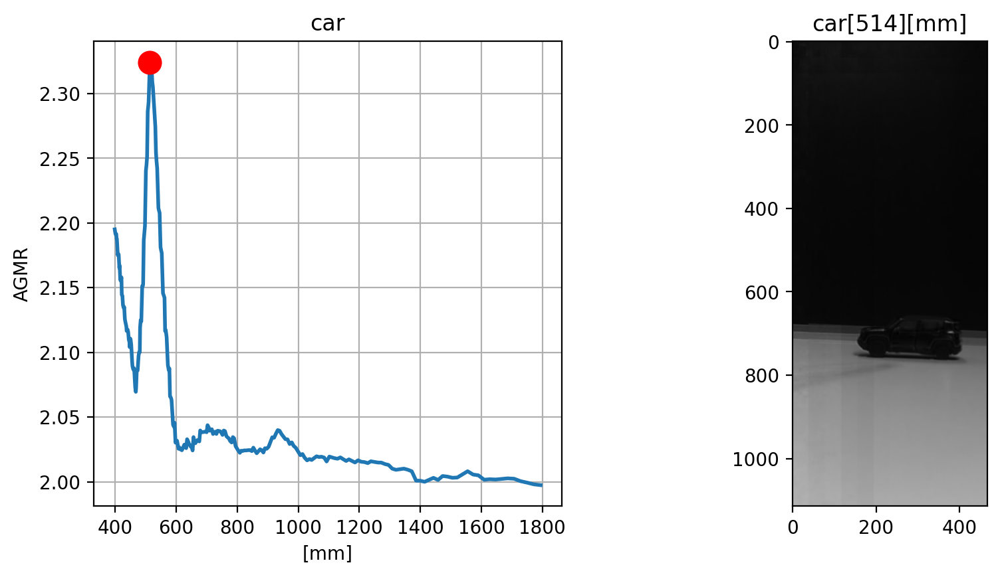

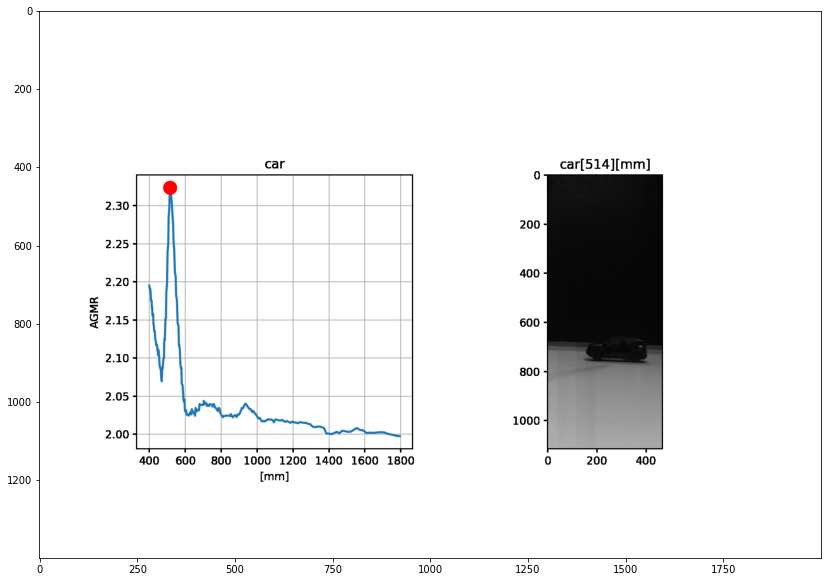

Elapsed time is 26.052634 seconds.
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
[16 11 10]
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000
num_objects is: 1
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA514
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk2
8400000
Frame number: 65


C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:210: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:216: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:221: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


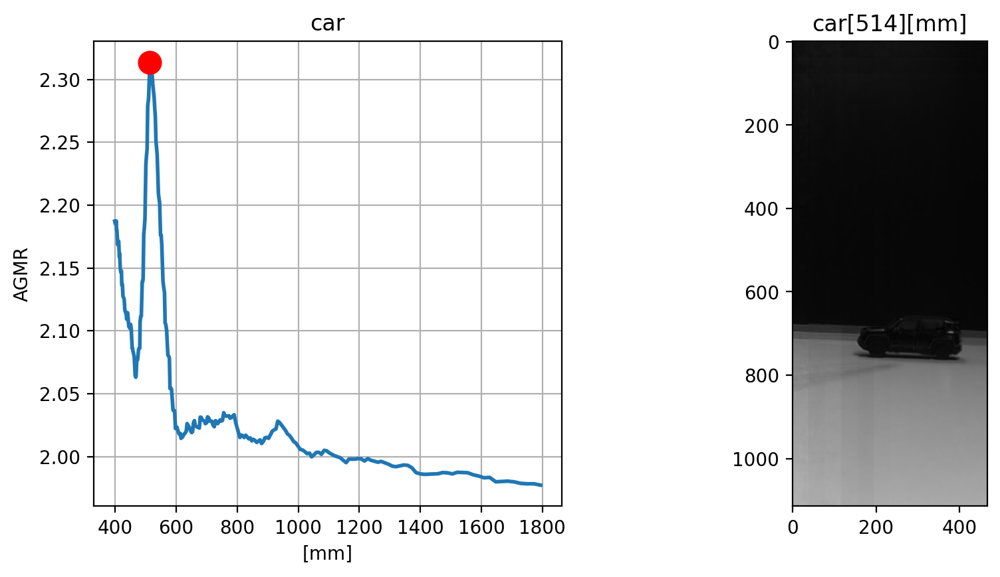

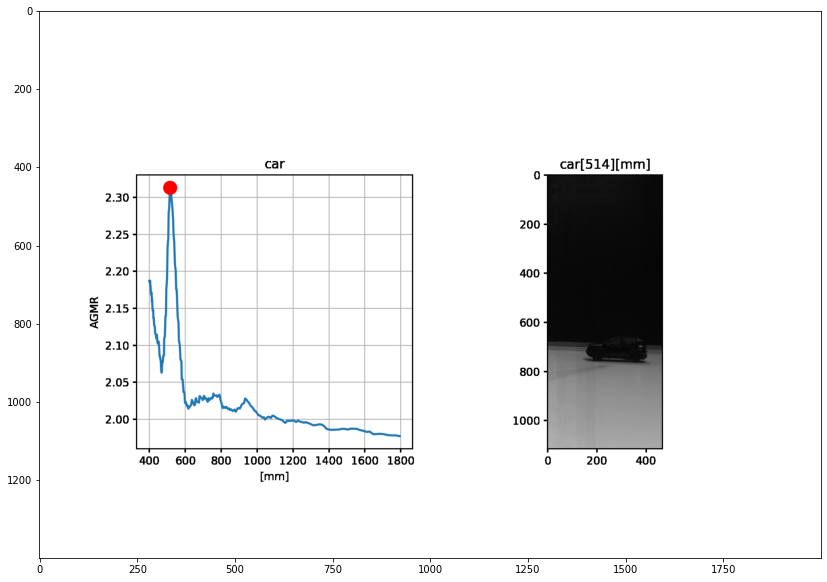

Elapsed time is 23.179706 seconds.
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
[19  9  9]
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000
num_objects is: 1
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA514
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk2
8400000
Frame number: 70


C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:210: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:216: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:221: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


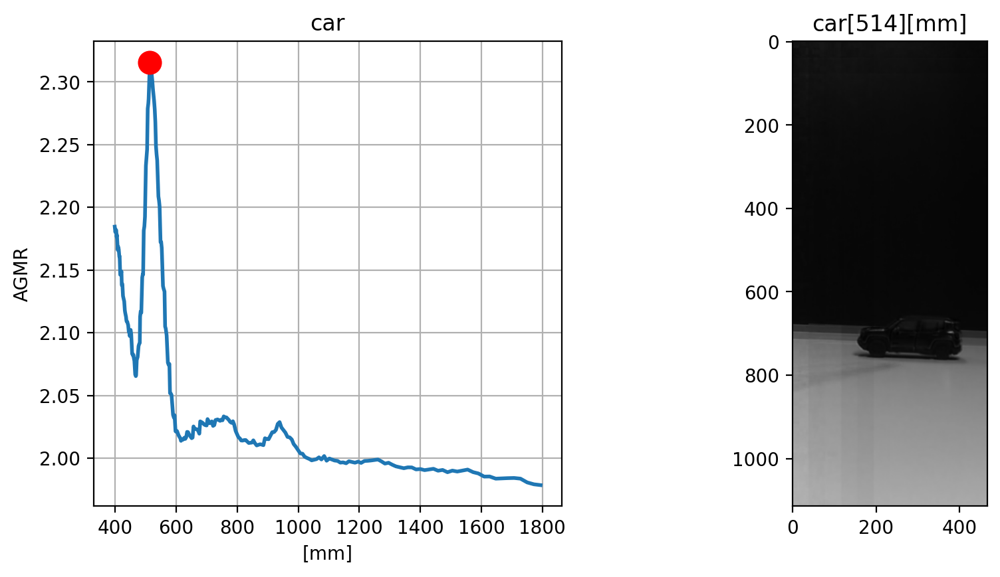

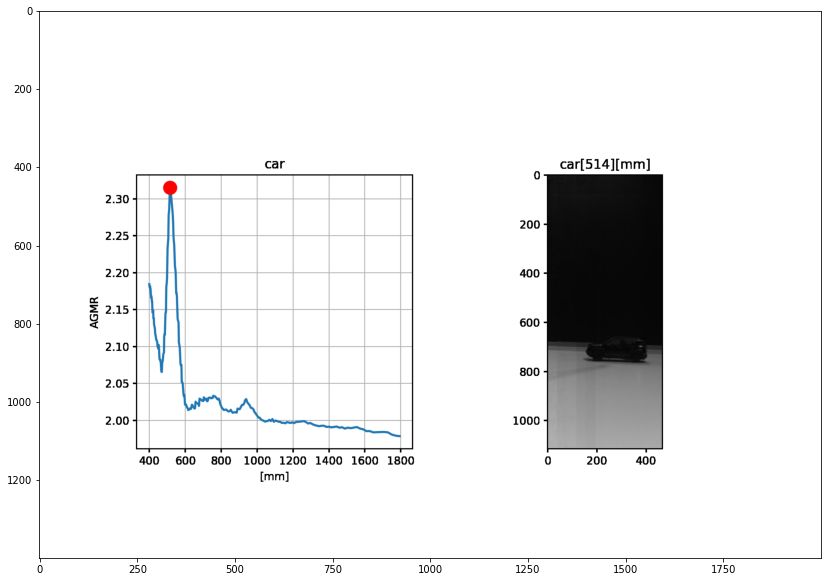

Elapsed time is 24.252060 seconds.
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
[17 11 10]
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000
num_objects is: 1
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA514
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk2
8400000
Frame number: 75


C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:210: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:216: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:221: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


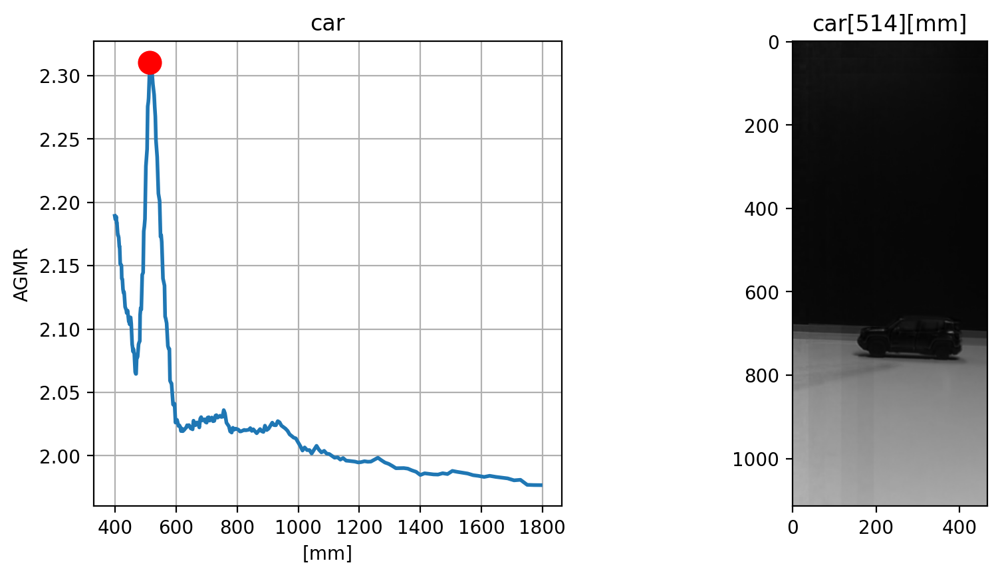

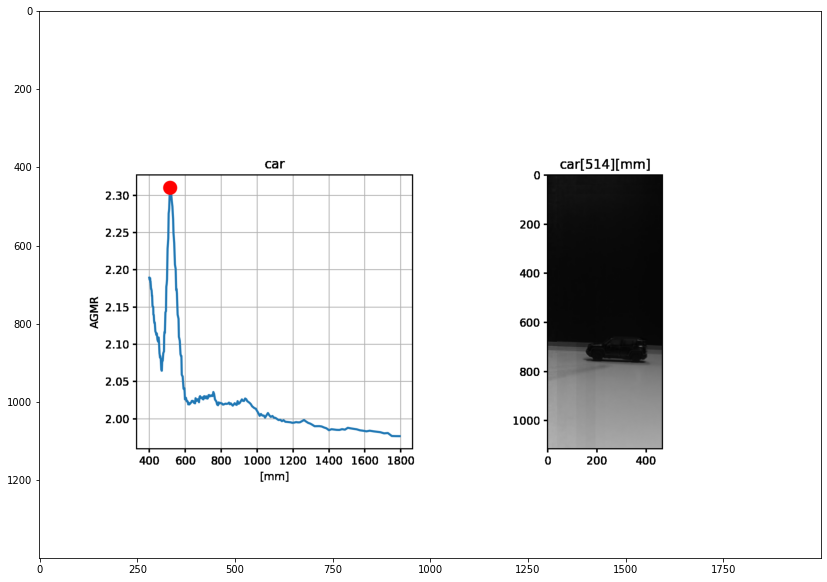

Elapsed time is 21.265653 seconds.
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
[17  9  9]
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
[15 10  9]
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  150.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000
num_objects is: 1
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA514
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk2
8400000
Frame number: 85


C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:210: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:216: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:221: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


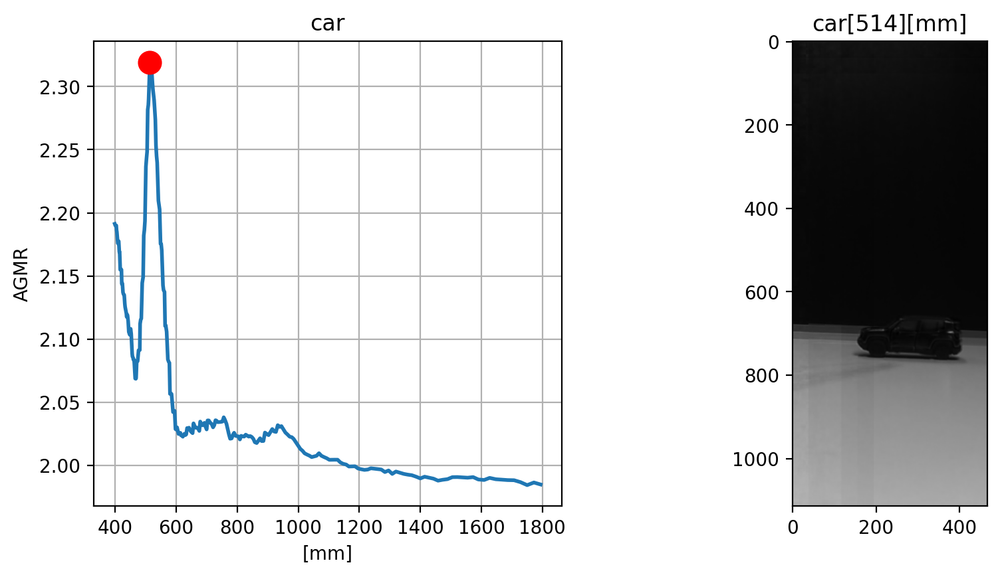

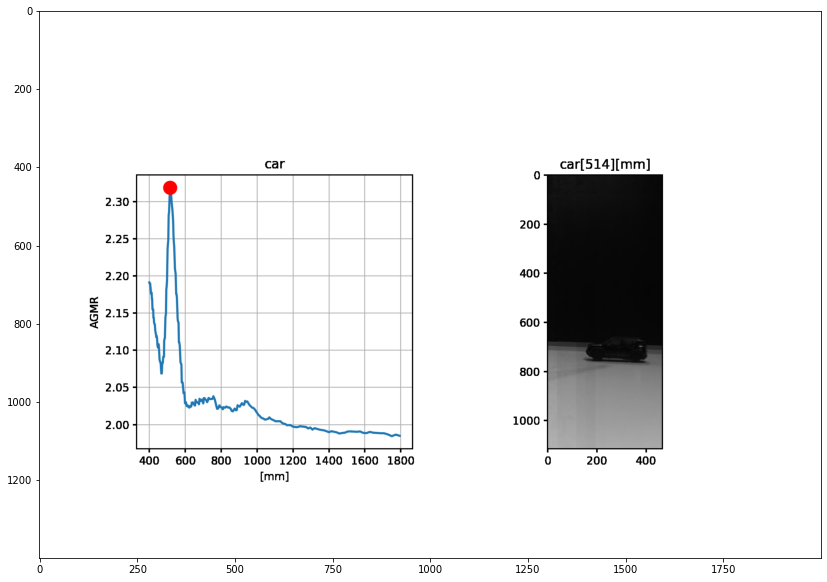

Elapsed time is 22.736852 seconds.
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
[13 11 10]
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000
num_objects is: 1
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA514
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk2
8400000
Frame number: 90


C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:210: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:216: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:221: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


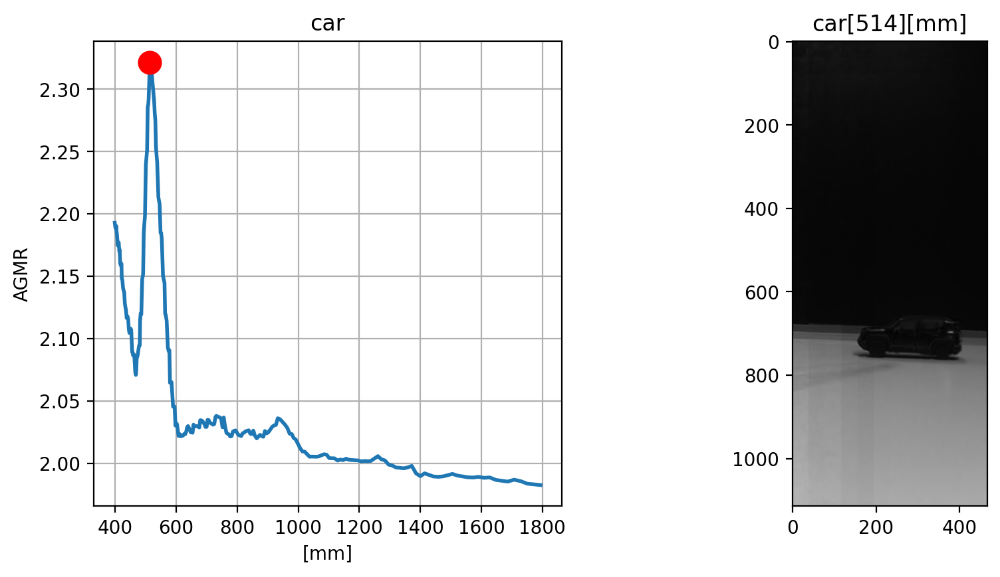

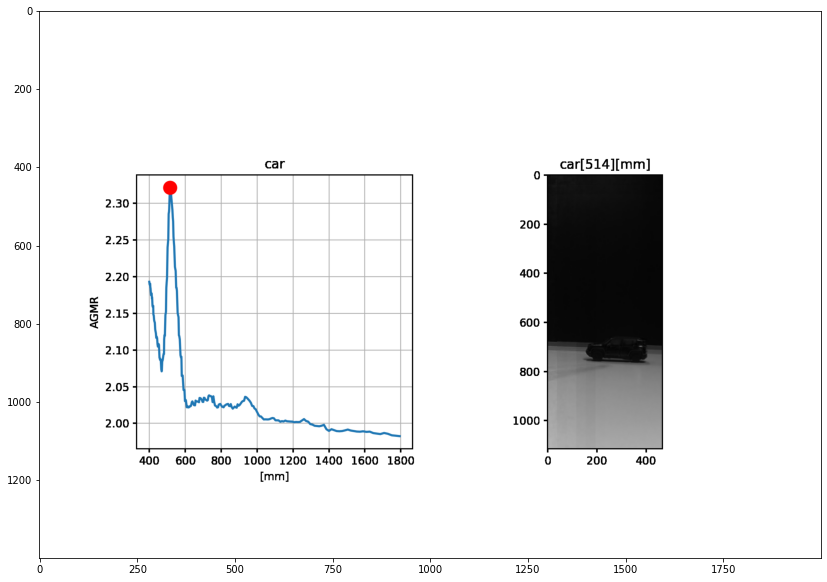

Elapsed time is 20.809961 seconds.
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
[18 10 10]
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000
num_objects is: 1
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA514
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk2
8400000
Frame number: 95


C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:210: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:216: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:221: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


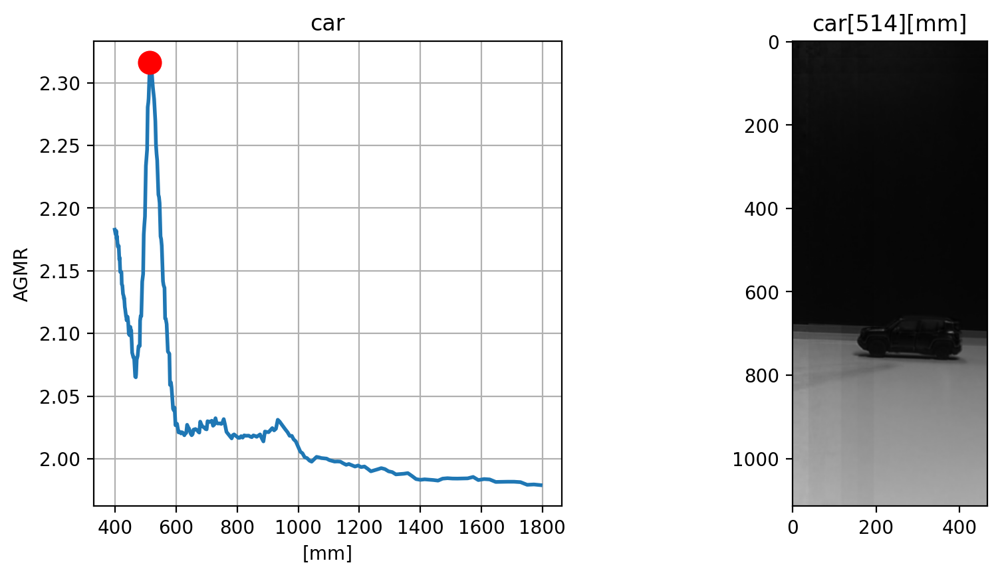

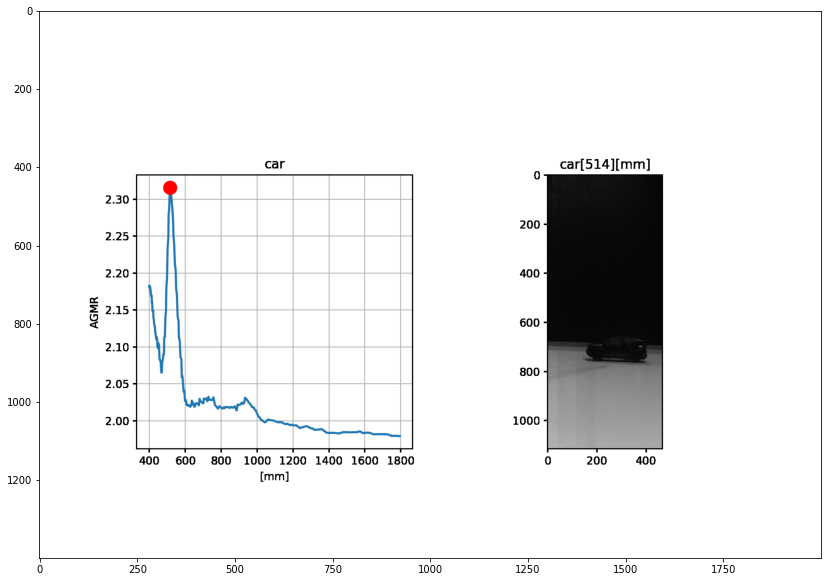

Elapsed time is 21.190205 seconds.
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
[15  7  7]
Processing 1 images
image                    shape: (1115, 467, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1115.00000
num_objects is: 1
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA514
fffffffffffffffffffffffffuuuuuuuuuuuuuuuuuuuuuuuuuuuuccccckkkkkkkkk2
8400000
Frame number: 100


C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:210: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:216: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
C:\Users\yair1\Desktop\CE final project\from_michael\Mask_RCNN\.venv2\lib\site-packages\ipykernel_launcher.py:221: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


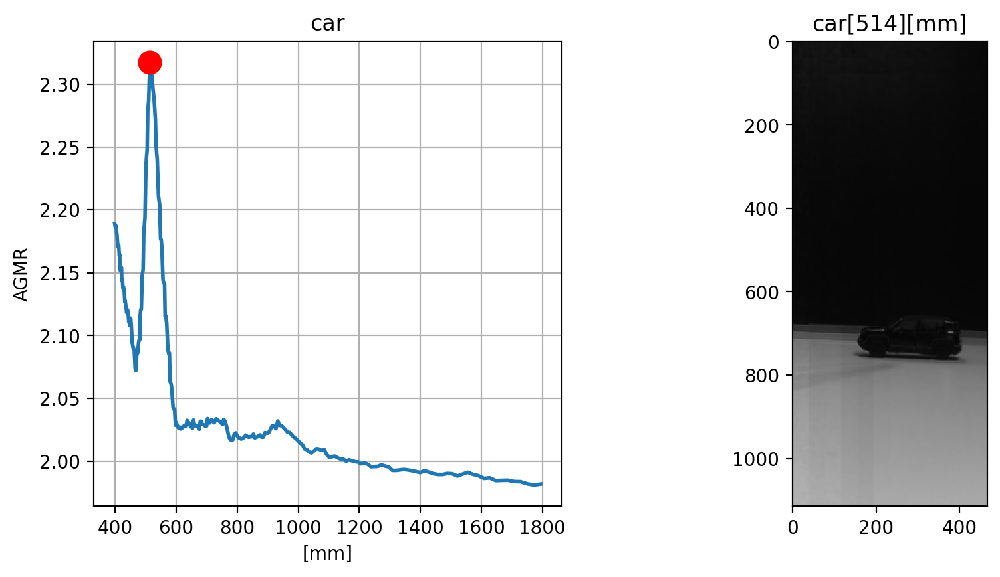

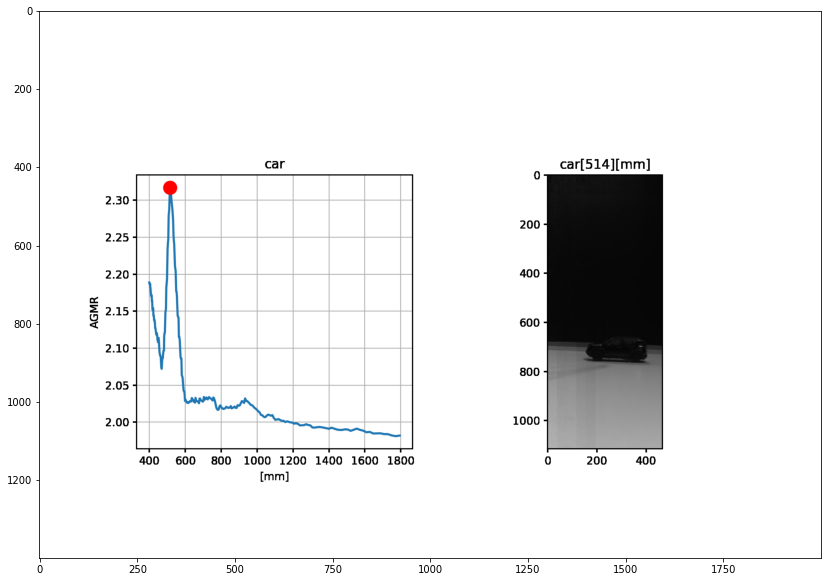

Elapsed time is 20.967374 seconds.


In [54]:
## for different scen it is need to change the directory and varaieble name
##
t = TicToc() #create instance of class

fx = 467
fy = 1115
#dist for the playmobile
zmin = 400
zmax = 1800
#zmin = 1000
#zmax = 5000
#zmin = 50
#zmax = 600
#zmin  = 1000
#zmax = 3000
lensy = 7
lensx = 3
zg = 20
fs = 5 #fs = 20 playmobile
deltax = 10
deltay = 10
L = 7
h = gkern(l=3, sig=1)
PixelSize = 0.01
#dir = r'C:\Users\michael kadosh\Desktop\תואר שני\תזה\קטעי וידאו ותמונות מתוך המערכת\REC'
#dir= r'C:\Users\yair1\Desktop\CE final project\from_michael\VIDEO3'
frame_inf = np.empty(shape=[0,21])
capture = cv2.VideoCapture(dir + '/Concat.avi')
count = 1
fourcc = cv2.VideoWriter_fourcc(*'XVID')
Int_vid = cv2.VideoWriter(dir + '/EV_AGMR_RES_video.avi', fourcc, 5, (3500,2500))
AGMR_vid = cv2.VideoWriter(dir + '/AGMR_tube_VIDEO.avi', fourcc, 1, (3200,2000))
person_vid = cv2.VideoWriter(dir + '/person_tube_VIDEO.avi', fourcc, 10, (467,1115))
real_distances = []
real_dist_temp = []
while (True):
    ret, frame = capture.read()
    if ret == True:
        if (count % fs == 0)  :
        #if (count % fs == 0 and count>65)  : #& (count>27) & (count<100)
            t.tic() #Start timer

            frame_num = count
            G = np.array(frame)
            print('|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||')
            print(G[7,7,:])
            f_3_7  =  G[0:1115, 0:467,:]
            #for i in range(1115):
            #    for j in range(467):
            #         print(f_3_7[i][j])

            ref_frame = G[0:1115, 0:467,:]

            G = G[:, :, 0]
            EI = G[0:1115, 0:467]
            seg_elemental_frame = model.detect([ref_frame], verbose=1)# The segmented frame from cmera 3.7
            re = seg_elemental_frame[0]

            [agmr_roi,max_agmr,z,Results] = ROI_AGMR( re['rois'], re['masks'], re['class_ids'], class_names, G, zg, lensx, lensy, zmin, zmax, EI, deltax, deltay, PixelSize = 0.01)
            num_objects = re['rois'].shape[0]
            
            #if num_objects != 1 and num_objects != 0:
            #if count>= 15:
            if num_objects != 0:
                [AGMR_graph, REC_seg_img, boj_inf, person, real_dist_temp] = plot_AGMR_graph(Results, num_objects,G, EI, deltax, deltay, lensx, lensy, PixelSize, zg, h,class_names,ref_frame,seg_elemental_frame,frame_num,f_3_7 )
                print(REC_seg_img.size)
                real_distances = real_distances + real_dist_temp
               #obj_inf = pd.DataFrame(boj_inf)
                frame_inf = np.append(frame_inf, boj_inf, axis=0)
                REC_seg_img
               #[distance, Int_Img] = ReconstructedVideo(Zmax, G, EI, deltax, deltay, lensx, lensy, PixelSize, zg, h)
               # convert canvas to image
                print('Frame number:',count)
                #plt.figure(figsize=(14,12))
                #plt.imshow(AGMR_graph)
                #plt.show()
                plt.figure(figsize=(14,12))
                plt.imshow(cv2.cvtColor(REC_seg_img, cv2.COLOR_BGR2RGB))
                plt.show() 
                #plt.figure(figsize=(14,12))
                #plt.imshow(cv2.cvtColor(person, cv2.COLOR_BGR2RGB))
                #plt.show()  
                Int_vid.write(REC_seg_img)
                AGMR_vid.write(AGMR_graph)
                person_vid.write(person)
                t.toc() #Time elapsed since t.tic()

            
        count += 1
    else:
        break

# cv2.imshow('frame', frame)
# if cv2.waitKey(30) & 0xFF == ord('q'):
# break
name = 'computer and person' ##'Track and car'
writer = pd.ExcelWriter(dir +'\Obj_inf_'+name+'.xlsx')
dict = {'Frame num':frame_inf[:,0],'Lable': frame_inf[:,1], 'score': frame_inf[:,2], 'ROI ratio': frame_inf[:,3], 'mask ratio': frame_inf[:,4], 'Distance':frame_inf[:,5], 'c.m x': frame_inf[:,6], 'c.m y': frame_inf[:,7]}
df = pd.DataFrame(dict)
df.to_excel(writer)
writer.save()
writer.close()
Int_vid.set(cv2.CAP_PROP_FPS,5)
AGMR_vid.set(cv2.CAP_PROP_FPS,3)
person_vid.set(cv2.CAP_PROP_FPS,3)
capture.release()
AGMR_vid.release()
person_vid.release()
Int_vid.release()
cv2.destroyAllWindows()




In [55]:
def apply_mask(image, mask):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    image[:, :, 0] = np.where(
        mask == 0,
        gray_image[:, :],
        image[:, :, 0]
    )
    image[:, :, 1] = np.where(
        mask == 0,
        gray_image[:, :],
        image[:, :, 1]
    )
    image[:, :, 2] = np.where(
        mask == 0,
        gray_image[:, :],
        image[:, :, 2]
    )
    return image


In [56]:
from numpy import mat
from visualize_cv import display_instances
import pandas as pd
import scipy.io
#ids_list=class_ids_list
# dir = r'C:\Users\michael kadosh\Desktop\3D objects segmentation\VIDEO'
#capture = cv2.VideoCapture(dir+'/Segmantation_video.avi')
capture = cv2.VideoCapture(dir + '/RecCam_3_7.avi')
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter(dir+'/Integral_video_Segmantation.avi', fourcc, 5, (467,1115))
d = scipy.io.loadmat(dir+'/Distance.mat')
#d = np.array(mat.get('dist')) # For converting to a NumPy array
#d[0,6]=1147
#print(d)
i = 0
while (True):
        ret, frame = capture.read()
        if ret == True:
            frame = frame
            results = model.detect([frame], verbose=1)
            r = results[0]
          
            #frame,df = display_instances(frame, r['rois'], r['masks'],r['class_ids'], class_names, r['scores'],r['class_ids'],d[0,i])
            frame,df, aaa = display_instances(frame, r['rois'], r['masks'],r['class_ids'], class_names, r['scores'],r['class_ids'], 1000)
            #props = measure.regionprops_table(frame1, frame, properties=['label','area', 'equivalent_diameter'])
            #df = pd.DataFrame(props)
            plt.figure(figsize=(14,12))
            plt.imshow(frame)
            plt.axis(False)
            plt.figure(figsize=(14,12))
            display(df)
            out.write(frame)
            writer = pd.ExcelWriter(dir+'\DataFrame.xlsx')
            df.to_excel(writer, sheet_name=chr(i))
            i += 1
        else:
            break

# cv2.imshow('frame', frame)
# if cv2.waitKey(30) & 0xFF == ord('q'):
# break
out.set(cv2.CAP_PROP_FPS,5)
capture.release()
out.release()
cv2.destroyAllWindows()
writer.save()
writer.close()

FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\yair1\\Desktop\\CE final project\\from_michael\\VIDEO10/Distance.mat'

In [57]:
#boj_inf
#frame_inf


for i in range(len(frame_inf[:,15])):
    frame_inf[i,15] = "name"
dict = {'Frame num': frame_inf[:,0],'Lable': frame_inf[:,1], 'score': frame_inf[:,2], 'ROI ratio': frame_inf[:,3], 'mask ratio': frame_inf[:,4], 'Distance':real_distances, 'c.m x': frame_inf[:,6], 'c.m y': frame_inf[:,7], 'extent_ratio': frame_inf[:,8], 'irregularity': frame_inf[:,9], 'mask' : frame_inf[:,10], 'y1' : frame_inf[:,11], 'x1' : frame_inf[:,12], 'y2' : frame_inf[:,13], 'x2' : frame_inf[:,14], 'names' : frame_inf[:,15], 'contrast' : frame_inf[:,16], 'r_avg' : frame_inf[:,17], 'g_avg' : frame_inf[:,18], 'b_avg' : frame_inf[:,19], 'rgb_avg' : frame_inf[:,20]}
df = pd.DataFrame(dict)
display(df)
print(real_distances)
#frame_inf2 = frame_inf
#frame_inf2[:,5] = real_distances
frame_inf[:,5] = real_distances
"""frame_inf3 = np.empty(shape=[frame_inf.shape[0],16])
for i in range(15):
    frame_inf3[:,i] = frame_inf[:,i]
frame_inf3[:,15] = frame_inf[:,0]
frame_inf3[:,5] = real_distances"""
count = fs
max_frame = 100
while True:
    if (max_frame + fs) in frame_inf[:,0]:
        max_frame = max_frame + fs
    else:
        break
        
for i in frame_inf:
    print(str(i[0]) + " " + str(i[1]))

 
#dict = {'Frame num':boj_inf[:,0],'Lable': boj_inf[:,1], 'score': boj_inf[:,2], 'ROI ratio': boj_inf[:,3], 'mask ratio': boj_inf[:,4], 'Distance': boj_inf[:,5], 'c.m x': boj_inf[:,6], 'c.m y': boj_inf[:,7]}

,Frame num,Lable,score,ROI ratio,mask ratio,Distance,c.m x,c.m y,extent_ratio,irregularity,...,y1,x1,y2,x2,names,contrast,r_avg,g_avg,b_avg,rgb_avg
0,5,car,0.996573,0.015373,0.011086,399,69.0,684.0,0.42029,400.957139,...,655,0,713,138,name,77.934612,11.475637,47.50912,67.999875,0.369657
1,5,car,0.921697,0.0578,0.039246,518,276.5,711.0,0.462745,1515.669301,...,652,149,770,404,name,59.0579,4.4446,9.636291,36.229379,0.283298
2,10,car,0.996513,0.0186,0.011978,401,101.5,687.0,0.323699,430.761985,...,659,15,715,188,name,76.70964,9.479562,40.254542,58.59104,0.361442
3,10,car,0.946813,0.056549,0.037842,518,274.0,712.5,0.449219,1459.850508,...,655,146,770,402,name,59.221304,4.269395,9.280129,36.299151,0.277777
4,15,car,0.992833,0.015572,0.008362,399,147.5,685.5,0.320755,286.83483,...,660,68,711,227,name,79.60755,9.585522,36.882846,51.980885,0.384614
5,15,car,0.939616,0.053589,0.03833,518,276.5,712.5,0.45749,1475.954009,...,656,153,769,400,name,59.670505,4.822364,10.494106,39.716384,0.281726
6,20,car,0.778026,0.059692,0.040253,520,273.0,712.0,0.432836,1557.2811,...,654,139,770,407,name,59.295725,4.965485,12.085982,39.364288,0.281339
7,25,car,0.939421,0.055664,0.037689,516,277.0,712.5,0.456349,1451.96487,...,655,151,770,403,name,59.877585,4.327364,10.96501,39.095445,0.261936
8,30,car,0.941784,0.056427,0.036713,518,282.0,714.5,0.434615,1410.846374,...,658,152,771,412,name,60.243609,9.311879,13.019537,32.815283,0.465247
9,30,car,0.743953,0.004478,0.002205,518,410.5,694.0,0.830189,65.658983,...,672,384,716,437,name,94.532396,5.143225,37.118353,41.346484,0.386898


[399, 518, 401, 518, 399, 518, 520, 516, 518, 518, 518, 518, 518, 518, 518, 518, 516, 518, 514, 514, 514, 514, 514, 514, 514, 514, 514]
5 car
5 car
10 car
10 car
15 car
15 car
20 car
25 car
30 car
30 car
35 car
35 car
40 car
40 car
45 car
45 car
50 car
50 car
55 car
60 car
65 car
70 car
75 car
85 car
90 car
95 car
100 car


In [ ]:
z = ( 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111,
        112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124,
        125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137,
        138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150,
        151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163,
        164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176,
        177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189,
        190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202,
        203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215,
        216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228,
        229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241,
        242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253, 254,
        255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267,
        268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280,
        281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293,
        294, 295, 296, 297, 299, 300, 301, 302, 303, 304, 305, 306, 307,
        308, 309, 310, 311, 313, 314, 315, 316, 318, 319, 320, 321, 323,
        324, 325, 326, 327, 328, 329, 330, 331, 332, 334, 335, 336, 337,
        338, 339, 340, 341, 342, 343, 345, 346, 347, 348, 349, 350, 351,
        352, 353, 354, 355, 356, 358, 359, 360, 361, 362, 364, 365, 366,
        367, 368, 369, 371, 372, 373, 374, 375, 376, 378, 379, 380, 381,
        382, 383, 385, 386, 387, 388, 389, 391, 393, 394, 395, 396, 397,
        398, 401, 402, 403, 404, 405, 406, 409, 410, 411, 412, 414, 415,
        417, 419, 420, 421, 422, 424, 426, 428, 429, 430, 432, 433, 436,
        437, 438, 440, 441, 443, 445, 447, 448, 450, 451, 453, 456, 457,
        459, 460, 462, 463, 466, 468, 469, 471, 472, 474, 477, 479, 481,
        482, 484, 486, 489, 491, 492, 494, 496, 498, 501, 503, 505, 507,
        509, 510, 514, 516, 518, 520, 522, 524, 528, 530, 532, 534, 536,
        538, 542, 544, 546, 549, 551, 553, 557, 559, 562, 564, 566, 569,
        573, 576, 578, 580, 583, 585, 590, 593, 595, 598, 600, 603, 608,
        611, 614, 616, 619, 622, 627, 630, 633, 636, 639, 642, 648, 651,
        654, 657, 660, 663, 669, 673, 676, 679, 682, 686, 693, 696, 700,
        703, 707, 710, 717, 721, 725, 729, 732, 736, 744, 748, 752, 756,
        760, 765, 773, 777, 782, 786, 790, 795, 804, 809, 813, 818, 823,
        828, 838, 843, 848, 853, 858, 864, 875, 880, 886, 891, 897, 903,
        915, 921, 927, 933, 939, 945, 958, 965, 972, 979, 985, 992)
z=np.array(z)
print(z)
depth_res = np.diff(z)
print(depth_res)

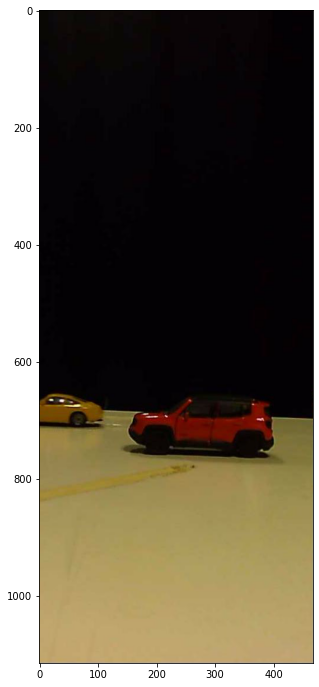

[]
rois is: []
[]
1
2
3
4
5


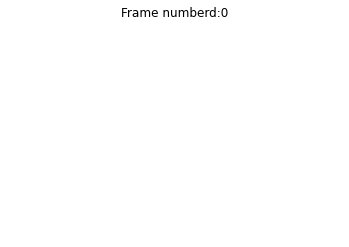

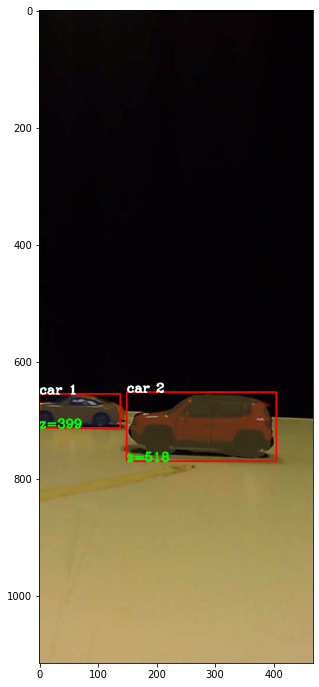

[]
rois is: []
[]
6
7
8
9
10


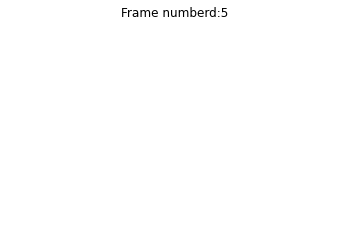

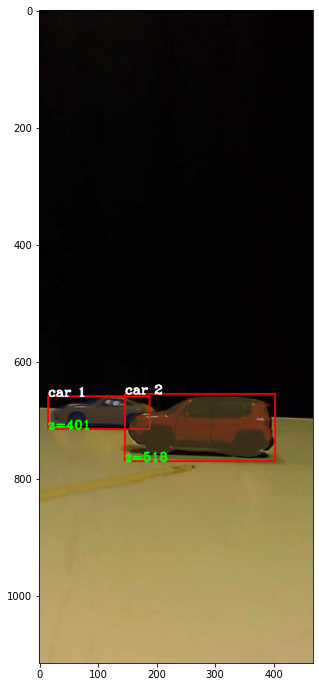

[]
rois is: []
[]
11
12
13
14
15


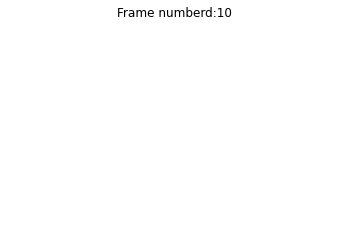

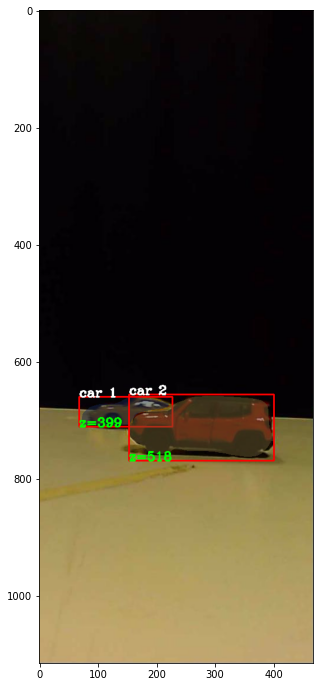

[]
rois is: []
[]
16
17
18
19
20


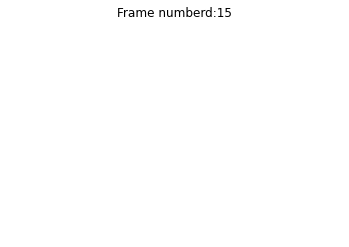

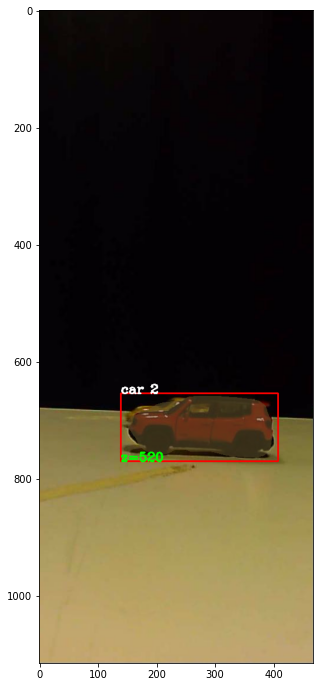

[]
rois is: []
[]
21
22
23
24
25


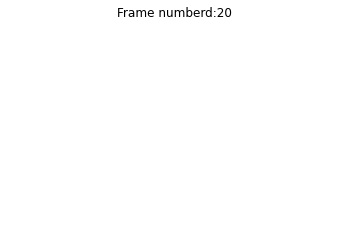

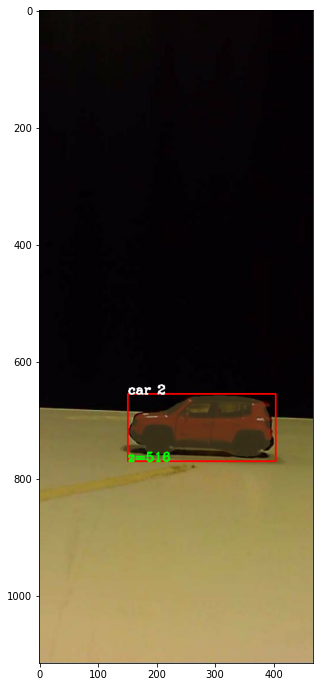

[]
rois is: []
[]
26
27
28
29
30


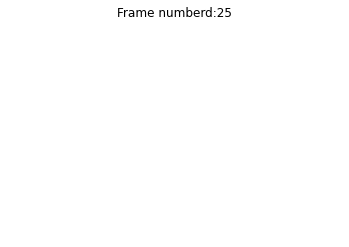

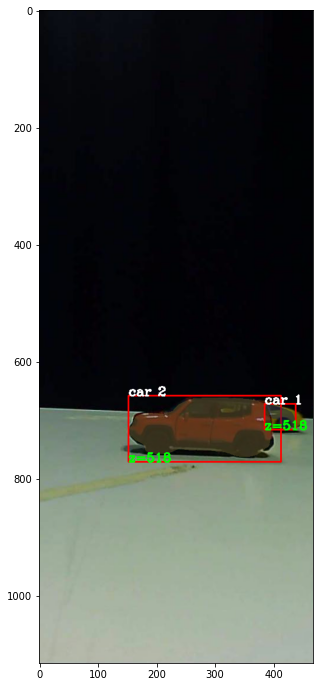

[]
rois is: []
[]
31
32
33
34
35


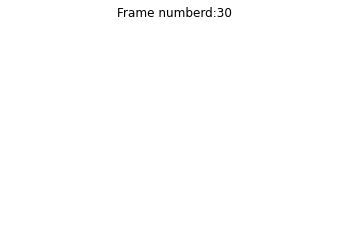

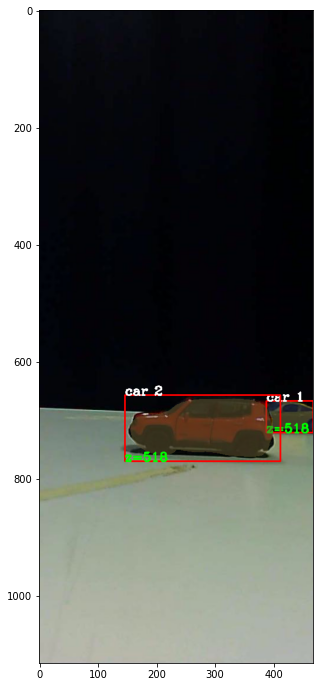

[]
rois is: []
[]
36
37
38
39
40


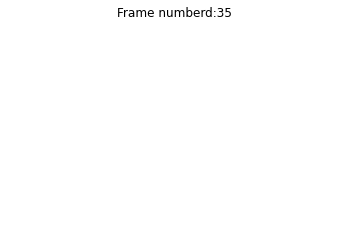

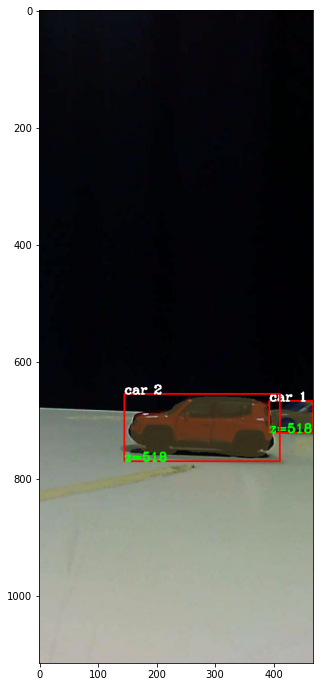

[]
rois is: []
[]
41
42
43
44
45


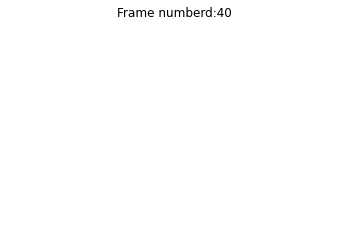

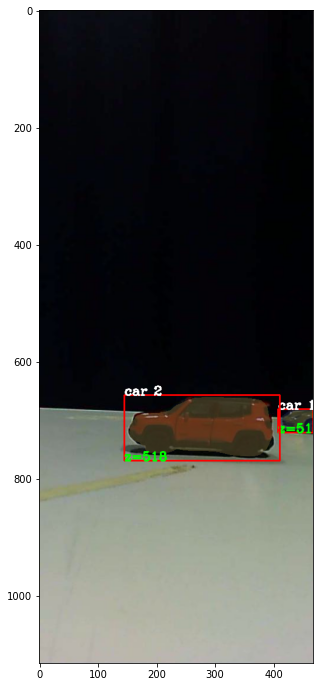

[]
rois is: []
[]
46
47
48
49
50


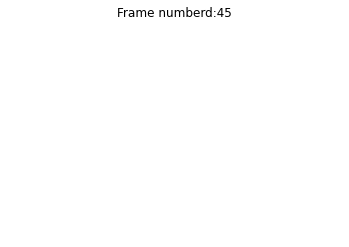

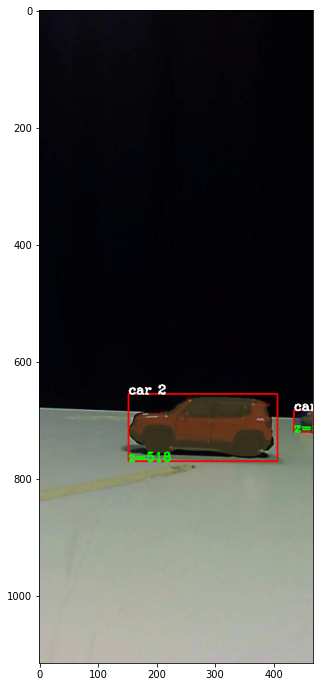

[]
rois is: []
[]
51
52
53
54
55


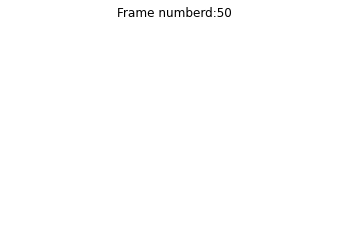

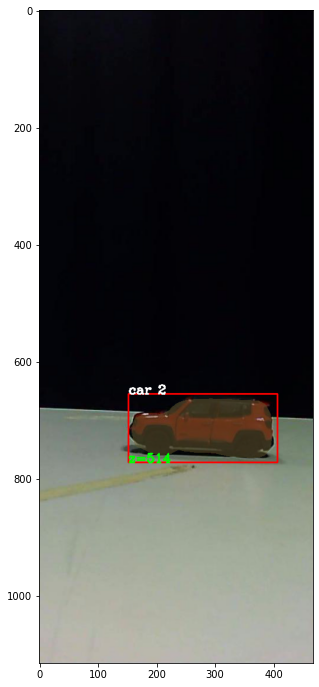

[]
rois is: []
[]
56
57
58
59
60


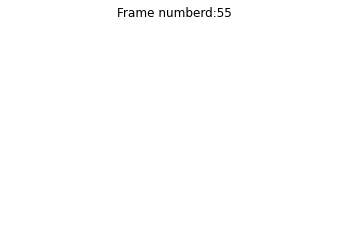

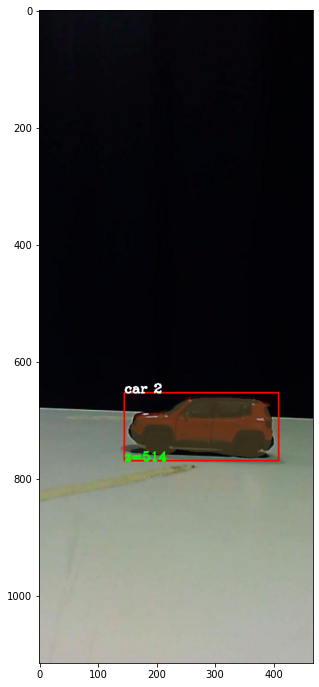

[]
rois is: []
[]
61
62
63
64
65


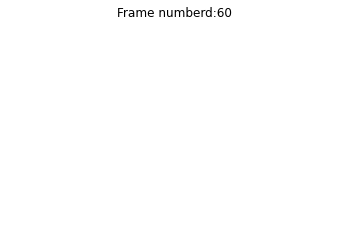

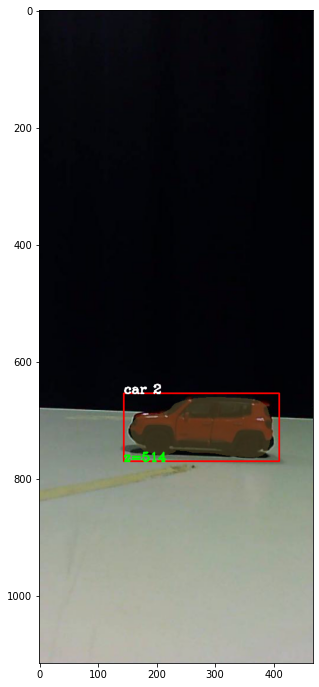

[]
rois is: []
[]
66
67
68
69
70


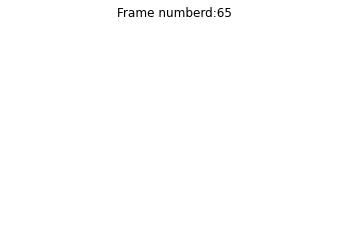

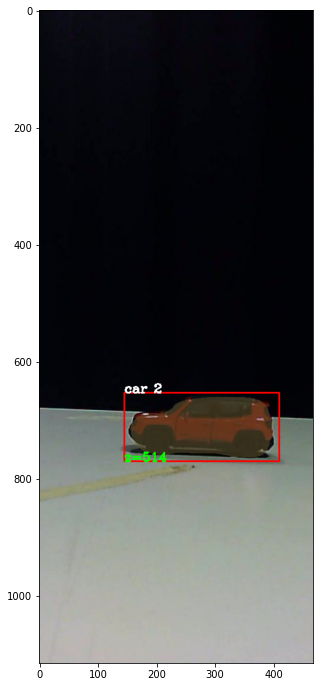

[]
rois is: []
[]
71
72
73
74
75


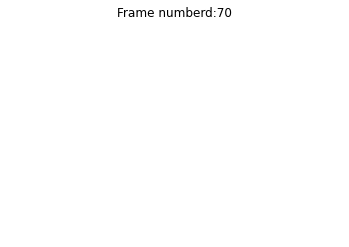

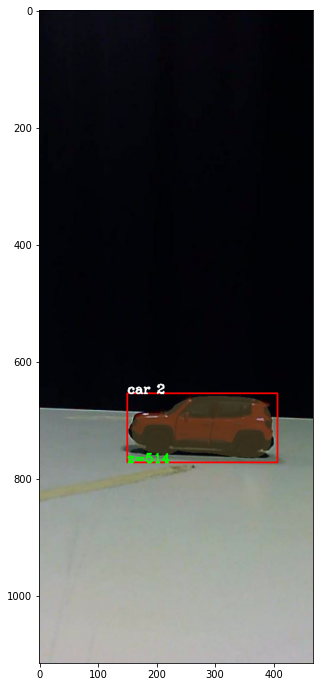

[]
rois is: []
[]
76
77
78
79
80


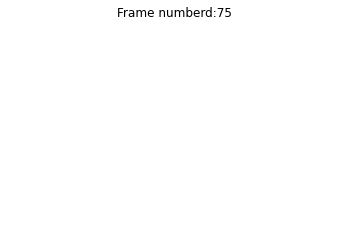

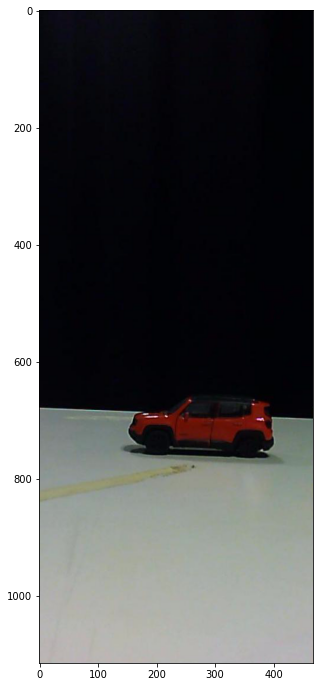

[]
rois is: []
[]
81
82
83
84
85


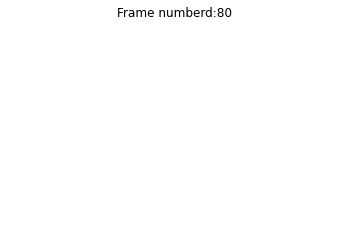

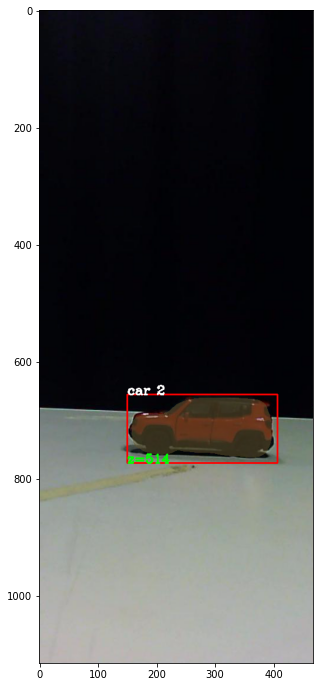

[]
rois is: []
[]
86
87
88
89
90


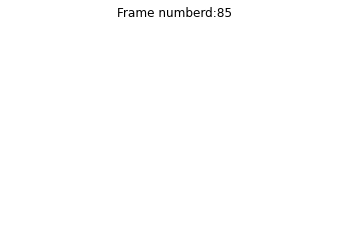

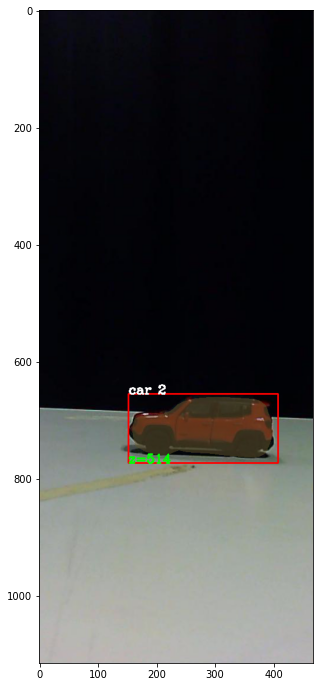

[]
rois is: []
[]
91
92
93
94
95


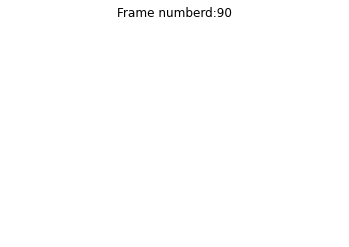

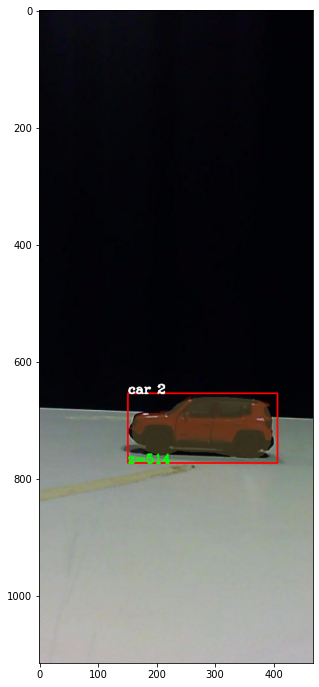

[]
rois is: []
[]
96
97
98
99
100


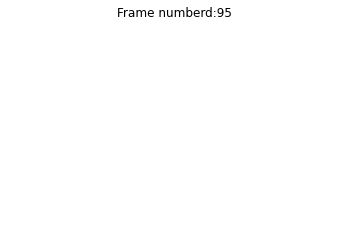

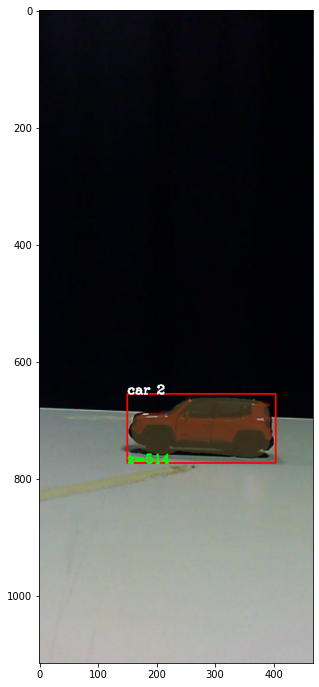

[]
rois is: []
[]
101
102
103
104


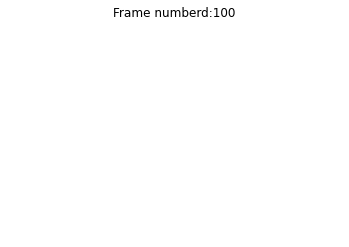

In [58]:
import importlib
import visualize_cv
importlib.reload(visualize_cv)
from visualize_cv import display_instances
from visualize_cv import display_instances_roi
from visualize_cv import better_display_instances
from visualize_cv import tracker
from visualize_cv import tracker2
from visualize_cv import tracker3
from visualize_cv import tracker4
from visualize_cv import tracker5
from visualize_cv import tracker6
from visualize_cv import tracker7
from visualize_cv import tracker8
from visualize_cv import tracker9

#better_display_instances()

##dir= r'C:\Users\yair1\Desktop\CE final project\from_michael\VIDEO3'
##dir = r'C:\Users\michael kadosh\Desktop\Trak and car\scen_1'
#capture = cv2.VideoCapture(dir + '/RecCam_3_7.avi')
capture = cv2.VideoCapture(dir + '/Concat.avi')
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter(dir + '/Distances.avi', fourcc, 1, (467,1115))
class_ids_list = np.empty(shape=(0,120), dtype=int)
count = 0
fs = 5 # sampeling rate
d_i = 0
colors = {}
obj_tracked = tracker8(frame_inf, fs, max_frame, 0)
while (True):
    ret, frame = capture.read()
    if (ret == True):
        if count %fs == 0 and fs != 0:
        #if count %fs == 0 and fs != 0 and count>40:
            G = np.array(frame)
            #ref_image = frame
            ref_frame = G[0:1115, 0:467,:]
            #results = model.detect([frame], verbose=1)
            """results = model.detect([ref_frame], verbose=1)"""
            #if count == fs*2:
            #    results1 = model.detect([frame], verbose=1)
            """r = results[0]"""
            
            """frame, df, d_i = display_instances(ref_frame, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'],r['class_ids'],real_distances,d_i)"""
            #frame = better_display_instances(ref_frame, count, frame_inf, obj_tracked)
            frame = better_display_instances(ref_frame, count, obj_tracked,colors)
            #frame = ref_frame
            plt.figure(figsize=(14,12))
            plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
            plt.show()
            plt.title('Frame numberd:{:.0f}'.format(count))
            plt.axis(False)
            plt.axis("off")
            class_ids_list = np.append(class_ids_list, r['class_ids'])
            out.write(frame)
            print(r['class_ids'])
            print('rois is:',r['rois'])
            print(class_ids_list)
        count = count + 1
        print(count)

    else: 
        break
    

# cv2.imshow('frame', frame)
# cv2.waitKey(30) & 0xFF == ord('q'):
# break
out.set(cv2.CAP_PROP_FPS,3)
capture.release()
out.release()
cv2.destroyAllWindows()
class_ids_list = list(dict.fromkeys(class_ids_list))## remove duplicates class in the class id list